# 🏥 MedSAM-Based Ulcerative Colitis Grading System
## Automated Mayo Endoscopic Score Classification with Segmentation & Clinical Captioning

---

### 📌 Project Overview

This notebook implements a **state-of-the-art deep learning pipeline** for automated grading of **Ulcerative Colitis (UC)** severity from colonoscopy images using the **Mayo Endoscopic Score (0-3)**. The system combines three powerful AI components:

1. **MedSAM Classifier** - Fine-tuned Medical Segment Anything Model for Mayo score classification
2. **MedSAM Segmentation** - Precise localization of affected mucosal regions
3. **LLaMA 7B VLM** - Clinical caption generation describing observed pathology

---

### 🎯 Mayo Endoscopic Score Classification

| Score | Severity | Clinical Description |
|-------|----------|---------------------|
| **Mayo 0** | Normal/Remission | Normal mucosa, intact vascular pattern, smooth surface |
| **Mayo 1** | Mild Disease | Mild erythema, decreased vascular pattern, mild granularity |
| **Mayo 2** | Moderate Disease | Marked erythema, absent vascular pattern, friability, erosions |
| **Mayo 3** | Severe Disease | Spontaneous bleeding, ulcerations, severe inflammation |

---

### 🏆 Model Performance

| Metric | Value |
|--------|-------|
| **Quadratic Weighted Kappa (QWK)** | **0.87** |
| Test Accuracy | 78.49% |
| Balanced Accuracy | 75.77% |
| Macro F1-Score | 74.61% |

---

### 🔧 Pipeline Architecture

In [1]:
# ===== CELL 1: SETUP AND DEPENDENCIES =====
# Install required packages

!pip install -q bitsandbytes accelerate
!pip install -q qwen-vl-utils[decord]==0.0.8 natsort
!pip install -q transformers>=4.46.0
!pip install -q scikit-learn seaborn

print("✅ All dependencies installed!")

✅ All dependencies installed!


In [2]:
# ===== CELL 2: IMPORTS =====

import os
import gc
import re
import json
import random
import textwrap
import warnings
from pathlib import Path
from datetime import datetime
from collections import Counter

import numpy as np
import pandas as pd
import cv2
import PIL.Image
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.gridspec import GridSpec
import seaborn as sns
from tqdm.auto import tqdm
from natsort import natsorted

import torch
import torch.nn as nn
import torch.nn.functional as F
from transformers import (
    SamModel,
    SamProcessor,
    AutoProcessor,
    AutoModelForVision2Seq,
    BitsAndBytesConfig
)

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    balanced_accuracy_score,
    cohen_kappa_score
)

warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Device configuration
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("="*70)
print("🏥 MEDSAM ULCERATIVE COLITIS GRADING SYSTEM")
print("="*70)
print(f"PyTorch Version: {torch.__version__}")
print(f"Device: {DEVICE}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
print("="*70)

gc.collect()
torch.cuda.empty_cache()
print("\n✅ Imports complete!")

2025-12-29 22:31:06.538732: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1767047466.565616     451 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1767047466.573540     451 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1767047466.625668     451 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1767047466.625688     451 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1767047466.625692     451 computation_placer.cc:177] computation placer alr

🏥 MEDSAM ULCERATIVE COLITIS GRADING SYSTEM
PyTorch Version: 2.8.0+cu126
Device: cuda
GPU: Tesla T4
GPU Memory: 15.8 GB

✅ Imports complete!


In [4]:
# ===== CELL 3: CONFIGURATION =====

class Config:
    """Central configuration for the inference pipeline."""
    
    # ═══════════════════════════════════════════════════════════════════
    # PATHS
    # ═══════════════════════════════════════════════════════════════════
    
    # Dataset - Kaggle input
    DATASET_PATH = "/kaggle/input/labeled-mes-dataset/patient_based_classified_images"
    
    # Trained model checkpoint
    MODEL_CHECKPOINT = "/kaggle/input/epoch5-model/best_medsam_classifier.pth"
    
    # Output directory
    OUTPUT_DIR = "/kaggle/working/outputs"
    
    # ═══════════════════════════════════════════════════════════════════
    # MODEL CONFIGURATION
    # ═══════════════════════════════════════════════════════════════════
    
    # MedSAM base model
    MEDSAM_MODEL_NAME = "flaviagiammarino/medsam-vit-base"
    
    # VLM for captioning
    VLM_MODEL_NAME = "natong19/Qwen2-VL-7B-Instruct-abliterated"
    
    # Classification settings
    NUM_CLASSES = 4
    IMG_SIZE = 256
    DROPOUT = 0.3
    
    # ═══════════════════════════════════════════════════════════════════
    # PREPROCESSING THRESHOLDS
    # ═══════════════════════════════════════════════════════════════════
    
    DARK_THRESHOLD = 60          # Mean brightness below this = dark
    BRIGHT_THRESHOLD = 200       # Mean brightness above this = bright
    LOW_CONTRAST_THRESHOLD = 30  # Std deviation below this = low contrast
    SMOOTHNESS_THRESHOLD = 15    # Laplacian variance below this = too smooth
    
    CLAHE_CLIP_LIMIT = 2.0
    CLAHE_GRID_SIZE = (8, 8)
    SHARPNESS_FACTOR = 1.5       # Sharpness enhancement factor
    
    # ═══════════════════════════════════════════════════════════════════
    # INFERENCE SETTINGS
    # ═══════════════════════════════════════════════════════════════════
    
    # Test set selection
    IMAGES_PER_CLASS = 5         # 5 images per Mayo class
    TOTAL_TEST_IMAGES = 20       # 20 total (5 × 4 classes)
    
    # Mayo class definitions
    MAYO_CLASSES = {
        0: {"name": "Mayo 0", "severity": "Normal/Remission", "color": "#2ecc71"},
        1: {"name": "Mayo 1", "severity": "Mild Disease", "color": "#f39c12"},
        2: {"name": "Mayo 2", "severity": "Moderate Disease", "color": "#e67e22"},
        3: {"name": "Mayo 3", "severity": "Severe Disease", "color": "#e74c3c"}
    }
    
    # Clinical hints for VLM
    MAYO_CLINICAL_HINTS = {
        0: "normal colonic mucosa with clear, delicate branching vascularity and smooth surface",
        1: "mild erythema with attenuated vascular patterns and subtle granularity",
        2: "marked erythema, absent vascularity, mucosal friability, and granular texture",
        3: "spontaneous bleeding, deep ulcerations, and severe mucosal damage"
    }


# Create output directory
os.makedirs(Config.OUTPUT_DIR, exist_ok=True)
os.makedirs(f"{Config.OUTPUT_DIR}/dashboards", exist_ok=True)
os.makedirs(f"{Config.OUTPUT_DIR}/masks", exist_ok=True)

# Verify paths
print("="*70)
print("📋 CONFIGURATION")
print("="*70)
print(f"Dataset Path: {Config.DATASET_PATH}")
print(f"Model Checkpoint: {Config.MODEL_CHECKPOINT}")
print(f"Output Directory: {Config.OUTPUT_DIR}")
print(f"Test Images: {Config.TOTAL_TEST_IMAGES} ({Config.IMAGES_PER_CLASS} per class)")
print("="*70)

# Verify dataset exists
if os.path.exists(Config.DATASET_PATH):
    patient_count = len([d for d in os.listdir(Config.DATASET_PATH) 
                         if os.path.isdir(os.path.join(Config.DATASET_PATH, d))])
    print(f"✅ Dataset found: {patient_count} patients")
else:
    print(f"❌ Dataset not found at: {Config.DATASET_PATH}")

# Verify checkpoint exists
if os.path.exists(Config.MODEL_CHECKPOINT):
    checkpoint_size = os.path.getsize(Config.MODEL_CHECKPOINT) / (1024**2)
    print(f"✅ Model checkpoint found: {checkpoint_size:.1f} MB")
else:
    print(f"❌ Checkpoint not found at: {Config.MODEL_CHECKPOINT}")

📋 CONFIGURATION
Dataset Path: /kaggle/input/labeled-mes-dataset/patient_based_classified_images
Model Checkpoint: /kaggle/input/epoch5-model/best_medsam_classifier.pth
Output Directory: /kaggle/working/outputs
Test Images: 20 (5 per class)
✅ Dataset found: 564 patients
✅ Model checkpoint found: 1044.0 MB


In [7]:
# ===== CELL 4: MODEL DEFINITION (CORRECTED TO MATCH CHECKPOINT) =====
# This architecture MUST match what was used during training

import torch
import torch.nn as nn
from transformers import SamModel

class MedSAMClassifier(nn.Module):
    """
    MedSAM-based classifier for UC Mayo Score grading.
    
    IMPORTANT: This architecture matches the trained checkpoint.
    The checkpoint was trained with 64-dim pooled features (from spatial pooling).
    
    Architecture:
    - Vision Encoder: ViT-Base from MedSAM (89.6M params)
    - Pooling: Mean over spatial dimensions → 64-dim
    - Projection: Linear(64→512) → LayerNorm → GELU → Dropout
    - Classifier: Linear(512→256) → LayerNorm → GELU → Dropout → Linear(256→4)
    - Ordinal Heads: 3 binary classifiers (256→1) for ordinal regression
    """
    
    def __init__(self, model_name: str, num_classes: int = 4, dropout: float = 0.3):
        super().__init__()
        
        # Load MedSAM
        self.medsam = SamModel.from_pretrained(model_name)
        self.vision_encoder = self.medsam.vision_encoder
        
        # Get embedding dimension by checking encoder output
        # MedSAM outputs features with shape [B, H, W, C] where C=64 after spatial pooling
        self.embed_dim = 64  # This is the pooled dimension from training
        
        # Projection layer: 64 → 512
        self.projection = nn.Sequential(
            nn.Linear(self.embed_dim, 512),
            nn.LayerNorm(512),
            nn.GELU(),
            nn.Dropout(dropout)
        )
        
        # Classifier head: 512 → 256 → 4
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.LayerNorm(256),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(256, num_classes)
        )
        
        # Ordinal regression heads (for ordinal loss during training)
        # These take 256-dim input from intermediate classifier layer
        self.ordinal_heads = nn.ModuleList([
            nn.Linear(256, 1) for _ in range(num_classes - 1)
        ])
        
        self.num_classes = num_classes
    
    def forward(self, pixel_values: torch.Tensor):
        """
        Forward pass.
        
        Args:
            pixel_values: Input tensor [B, C, H, W]
            
        Returns:
            class_logits: Classification logits [B, num_classes]
            ordinal_logits: Ordinal regression logits [B, num_classes-1]
        """
        # Get encoder features
        # Output shape: [B, H, W, C] where H=W=16 for 256x256 input, C=256
        encoder_output = self.vision_encoder(pixel_values)
        features = encoder_output.last_hidden_state  # [B, 16, 16, 256]
        
        # Global average pooling over spatial dimensions
        # The training used mean over all dimensions except batch → 64-dim output
        # This is because the actual output is [B, 64, 64, 64] and mean gives [B, 64]
        pooled = features.mean(dim=[1, 2])  # [B, 256] or [B, 64] depending on encoder
        
        # If pooled dim doesn't match, we need adaptive pooling
        # The checkpoint expects 64-dim input to projection layer
        if pooled.shape[-1] != self.embed_dim:
            # Use adaptive approach - take mean across feature dim too if needed
            # Or project down
            pooled = features.reshape(features.shape[0], -1)  # Flatten spatial
            pooled = pooled[:, :self.embed_dim]  # Take first 64 dims
        
        # Projection
        projected = self.projection(pooled)  # [B, 512]
        
        # Get intermediate features (after first classifier layers, before final linear)
        intermediate = projected
        for layer in self.classifier[:-1]:  # All except last Linear layer
            intermediate = layer(intermediate)  # [B, 256]
        
        # Classification output
        class_logits = self.classifier[-1](intermediate)  # [B, 4]
        
        # Ordinal regression outputs
        ordinal_logits = torch.cat([
            head(intermediate) for head in self.ordinal_heads
        ], dim=1)  # [B, 3]
        
        return class_logits, ordinal_logits


# Alternative: Use the dynamic building approach from inference script
class MedSAMClassifierDynamic(nn.Module):
    """
    MedSAM-based classifier that dynamically builds classification layers.
    This is more robust as it auto-detects the feature dimension.
    """
    
    def __init__(self, model_name: str, num_classes: int = 4, dropout: float = 0.3):
        super().__init__()
        self.medsam = SamModel.from_pretrained(model_name)
        self.vision_encoder = self.medsam.vision_encoder
        self.num_classes = num_classes
        self.dropout = dropout
        
        # These will be built dynamically
        self.embed_dim = None
        self.projection = None
        self.classifier = None
        self.ordinal_heads = None
        self._initialized = False
    
    def _build_classifier(self, embed_dim: int, device):
        """Build classification layers based on actual embedding dimension."""
        self.embed_dim = embed_dim
        
        self.projection = nn.Sequential(
            nn.Linear(embed_dim, 512),
            nn.LayerNorm(512),
            nn.GELU(),
            nn.Dropout(self.dropout)
        ).to(device)
        
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.LayerNorm(256),
            nn.GELU(),
            nn.Dropout(self.dropout),
            nn.Linear(256, self.num_classes)
        ).to(device)
        
        self.ordinal_heads = nn.ModuleList([
            nn.Linear(256, 1) for _ in range(self.num_classes - 1)
        ]).to(device)
        
        self._initialized = True
    
    def forward(self, pixel_values: torch.Tensor):
        """Forward pass with dynamic layer building."""
        # Get encoder features
        features = self.vision_encoder(pixel_values).last_hidden_state
        
        # Pool over spatial dimensions
        pooled = features.mean(dim=[1, 2])
        
        # Build classifier on first forward pass
        if not self._initialized:
            self._build_classifier(pooled.shape[-1], pooled.device)
        
        # Projection
        projected = self.projection(pooled)
        
        # Get intermediate for ordinal heads
        intermediate = projected
        for layer in self.classifier[:-1]:
            intermediate = layer(intermediate)
        
        # Outputs
        class_logits = self.classifier[-1](intermediate)
        ordinal_logits = torch.cat([
            head(intermediate) for head in self.ordinal_heads
        ], dim=1)
        
        return class_logits, ordinal_logits


print("✅ Model architecture defined")
print("   - MedSAMClassifier: Fixed architecture (64-dim input)")
print("   - MedSAMClassifierDynamic: Auto-detects feature dimension")

✅ Model architecture defined
   - MedSAMClassifier: Fixed architecture (64-dim input)
   - MedSAMClassifierDynamic: Auto-detects feature dimension


In [32]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 5: MODEL DEFINITIONS - REPLACE WITH THIS
# ═══════════════════════════════════════════════════════════════════════════

# ===== CELL 5: MODEL DEFINITIONS =====

import torch
import torch.nn as nn
from transformers import SamModel, SamProcessor

print("=" * 70)
print("🧠 DEFINING MODEL ARCHITECTURES")
print("=" * 70)

class MedSAMClassifier(nn.Module):
    """
    MedSAM-based classifier for UC Mayo Score grading.
    Uses dynamic layer building to match checkpoint dimensions.
    """
    
    def __init__(self, model_name: str, num_classes: int = 4, dropout: float = 0.3):
        super().__init__()
        self.medsam = SamModel.from_pretrained(model_name)
        self.vision_encoder = self.medsam.vision_encoder
        self.num_classes = num_classes
        self.dropout_rate = dropout
        
        # Will be built dynamically on first forward pass
        self.projection = None
        self.classifier = None
        self.ordinal_heads = None
        self._built = False
    
    def _build_layers(self, embed_dim: int, device):
        """Build classification layers based on actual embedding dimension."""
        self.projection = nn.Sequential(
            nn.Linear(embed_dim, 512),
            nn.LayerNorm(512),
            nn.GELU(),
            nn.Dropout(self.dropout_rate)
        ).to(device)
        
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.LayerNorm(256),
            nn.GELU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(256, self.num_classes)
        ).to(device)
        
        self.ordinal_heads = nn.ModuleList([
            nn.Linear(256, 1) for _ in range(self.num_classes - 1)
        ]).to(device)
        
        self._built = True
        print(f"   ✅ Built classifier layers (input dim: {embed_dim})")
    
    def forward(self, pixel_values: torch.Tensor):
        """
        Forward pass.
        
        Returns:
            class_logits: [B, num_classes]
            ordinal_logits: [B, num_classes-1]
        """
        # Get encoder features
        features = self.vision_encoder(pixel_values).last_hidden_state
        
        # Pool over spatial dimensions
        pooled = features.mean(dim=[1, 2])
        
        # Build layers on first pass
        if not self._built:
            self._build_layers(pooled.shape[-1], pooled.device)
        
        # Projection
        projected = self.projection(pooled)
        
        # Get intermediate for ordinal heads
        intermediate = projected
        for layer in self.classifier[:-1]:
            intermediate = layer(intermediate)
        
        # Outputs
        class_logits = self.classifier[-1](intermediate)
        ordinal_logits = torch.cat([h(intermediate) for h in self.ordinal_heads], dim=1)
        
        return class_logits, ordinal_logits

print("✅ MedSAMClassifier defined!")

🧠 DEFINING MODEL ARCHITECTURES
✅ MedSAMClassifier defined!


In [34]:
#═══════════════════════════════════════════════════════════════════════════
# CELL 6: LOAD MODELS - REPLACE WITH THIS
# ═══════════════════════════════════════════════════════════════════════════

# ===== CELL 6: LOAD ALL MODELS =====

print("=" * 70)
print("📥 LOADING MODELS")
print("=" * 70)

# ─────────────────────────────────────────────────────────────────────────────
# MODEL 1: CLASSIFIER (from checkpoint)
# ─────────────────────────────────────────────────────────────────────────────
print("\n🧠 Loading MedSAM CLASSIFIER...")

classifier_model = MedSAMClassifier(
    model_name=Config.MEDSAM_MODEL_NAME,
    num_classes=Config.NUM_CLASSES,
    dropout=Config.DROPOUT
)
classifier_model = classifier_model.to(DEVICE)

# Load processor
classifier_processor = SamProcessor.from_pretrained(Config.MEDSAM_MODEL_NAME)

# Build layers with dummy forward pass
print("   Building layers with dummy forward...")
with torch.no_grad():
    dummy_image = Image.fromarray(np.zeros((256, 256, 3), dtype=np.uint8))
    dummy_inputs = classifier_processor(images=dummy_image, return_tensors="pt")
    _ = classifier_model(dummy_inputs['pixel_values'].to(DEVICE))

# Load checkpoint weights
print(f"   Loading checkpoint: {Config.MODEL_CHECKPOINT}")
checkpoint = torch.load(Config.MODEL_CHECKPOINT, map_location=DEVICE, weights_only=False)
classifier_model.load_state_dict(checkpoint['model_state_dict'])
classifier_model.eval()

print(f"   ✅ Classifier loaded! (QWK: {checkpoint.get('best_qwk', 'N/A'):.4f}, Epoch: {checkpoint.get('epoch', 'N/A')})")

# ─────────────────────────────────────────────────────────────────────────────
# MODEL 2: SEGMENTATION (fresh from HuggingFace)
# ─────────────────────────────────────────────────────────────────────────────
print("\n🖼️ Loading MedSAM SEGMENTATION model...")

medsam_seg_model = SamModel.from_pretrained(Config.MEDSAM_MODEL_NAME)
medsam_seg_model = medsam_seg_model.to(DEVICE)
medsam_seg_model.eval()

medsam_seg_processor = SamProcessor.from_pretrained(Config.MEDSAM_MODEL_NAME)

print("   ✅ Segmentation model loaded!")

# ─────────────────────────────────────────────────────────────────────────────
# MODEL 3: VLM FOR CAPTIONING
# ─────────────────────────────────────────────────────────────────────────────
print("\n📝 Loading VLM for captioning...")

from qwen_vl_utils import process_vision_info

quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_use_double_quant=True
)

vlm_model = AutoModelForVision2Seq.from_pretrained(
    Config.VLM_MODEL_NAME,
    quantization_config=quant_config,
    device_map="auto",
    torch_dtype=torch.float16,
    trust_remote_code=True
)

vlm_processor = AutoProcessor.from_pretrained(
    Config.VLM_MODEL_NAME,
    trust_remote_code=True
)

print("   ✅ VLM loaded!")

# ─────────────────────────────────────────────────────────────────────────────
# CREATE ALIASES FOR COMPATIBILITY
# ─────────────────────────────────────────────────────────────────────────────
model = classifier_model
medsam_processor = classifier_processor
processor = classifier_processor

print("\n" + "=" * 70)
print("✅ ALL MODELS LOADED SUCCESSFULLY!")
print("=" * 70)
print("""
📊 Models available:
   • classifier_model (model)     → Mayo score classification
   • medsam_seg_model             → Segmentation masks
   • vlm_model                    → Clinical captioning

📦 Processors:
   • classifier_processor (medsam_processor, processor)
   • medsam_seg_processor
   • vlm_processor
""")
print("=" * 70)

gc.collect()
torch.cuda.empty_cache()

📥 LOADING MODELS

🧠 Loading MedSAM CLASSIFIER...
   Building layers with dummy forward...
   ✅ Built classifier layers (input dim: 64)
   Loading checkpoint: /kaggle/input/epoch5-model/best_medsam_classifier.pth
   ✅ Classifier loaded! (QWK: 0.8704, Epoch: 5)

🖼️ Loading MedSAM SEGMENTATION model...


`torch_dtype` is deprecated! Use `dtype` instead!


   ✅ Segmentation model loaded!

📝 Loading VLM for captioning...


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

   ✅ VLM loaded!

✅ ALL MODELS LOADED SUCCESSFULLY!

📊 Models available:
   • classifier_model (model)     → Mayo score classification
   • medsam_seg_model             → Segmentation masks
   • vlm_model                    → Clinical captioning

📦 Processors:
   • classifier_processor (medsam_processor, processor)
   • medsam_seg_processor
   • vlm_processor



In [10]:
# ===== CELL 6: ADAPTIVE IMAGE PREPROCESSING =====

class AdaptiveImagePreprocessor:
    """
    Intelligent image preprocessing for colonoscopy images.
    
    Applies preprocessing ONLY when needed based on image analysis:
    - Dark images → CLAHE enhancement
    - Bright images → Brightness normalization
    - Low contrast → Contrast enhancement
    - Too smooth → Sharpness enhancement
    - Black borders → Border removal
    """
    
    def __init__(self):
        self.clahe = cv2.createCLAHE(
            clipLimit=Config.CLAHE_CLIP_LIMIT,
            tileGridSize=Config.CLAHE_GRID_SIZE
        )
        
        # Statistics tracking
        self.stats = {
            'total_processed': 0,
            'dark_enhanced': 0,
            'bright_normalized': 0,
            'sharpness_enhanced': 0,
            'contrast_enhanced': 0,
            'borders_removed': 0,
            'no_processing_needed': 0
        }
    
    def analyze_image(self, image):
        """
        Analyze image to determine what preprocessing is needed.
        
        Returns:
            dict: Analysis results with flags for each condition
        """
        # Convert to grayscale for analysis
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image
        
        # Calculate statistics
        mean_brightness = np.mean(gray)
        std_brightness = np.std(gray)
        
        # Calculate Laplacian variance (sharpness measure)
        laplacian = cv2.Laplacian(gray, cv2.CV_64F)
        sharpness = laplacian.var()
        
        return {
            'mean_brightness': mean_brightness,
            'std_brightness': std_brightness,
            'sharpness': sharpness,
            'is_dark': mean_brightness < Config.DARK_THRESHOLD,
            'is_bright': mean_brightness > Config.BRIGHT_THRESHOLD,
            'is_low_contrast': std_brightness < Config.LOW_CONTRAST_THRESHOLD,
            'is_too_smooth': sharpness < Config.SMOOTHNESS_THRESHOLD
        }
    
    def remove_black_borders(self, image):
        """Remove black borders common in endoscopy images."""
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        _, binary = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            largest = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(largest)
            padding = 5
            x, y = max(0, x - padding), max(0, y - padding)
            w = min(image.shape[1] - x, w + 2 * padding)
            h = min(image.shape[0] - y, h + 2 * padding)
            cropped = image[y:y+h, x:x+w]
            
            if cropped.shape[0] > 50 and cropped.shape[1] > 50:
                return cropped, True
        
        return image, False
    
    def apply_clahe(self, image):
        """Apply CLAHE for dark images."""
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        l = self.clahe.apply(l)
        lab = cv2.merge([l, a, b])
        return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    
    def normalize_brightness(self, image, target=140):
        """Normalize overly bright images."""
        hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        h, s, v = cv2.split(hsv)
        current = np.mean(v)
        if current > 0:
            factor = np.clip(target / current, 0.5, 1.5)
            v = np.clip(v * factor, 0, 255).astype(np.uint8)
        return cv2.cvtColor(cv2.merge([h, s, v]), cv2.COLOR_HSV2BGR)
    
    def enhance_sharpness(self, image):
        """Enhance sharpness for too smooth images."""
        # Convert to PIL for sharpness enhancement
        pil_image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        enhancer = ImageEnhance.Sharpness(pil_image)
        sharpened = enhancer.enhance(Config.SHARPNESS_FACTOR)
        return cv2.cvtColor(np.array(sharpened), cv2.COLOR_RGB2BGR)
    
    def enhance_contrast(self, image):
        """Enhance contrast for low contrast images."""
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe_mild = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8, 8))
        l = clahe_mild.apply(l)
        return cv2.cvtColor(cv2.merge([l, a, b]), cv2.COLOR_LAB2BGR)
    
    def adjust_gamma(self, image, gamma):
        """Apply gamma correction."""
        table = np.array([((i / 255.0) ** (1.0 / gamma)) * 255
                          for i in range(256)]).astype(np.uint8)
        return cv2.LUT(image, table)
    
    def preprocess(self, image_path):
        """
        Main preprocessing pipeline. Applies processing ONLY when needed.
        
        Args:
            image_path: Path to input image
            
        Returns:
            processed_image: Preprocessed image (BGR)
            processing_info: Dict with processing details
        """
        # Read image
        image = cv2.imread(str(image_path))
        if image is None:
            raise ValueError(f"Could not read image: {image_path}")
        
        original = image.copy()
        processing_steps = []
        
        # Step 1: Remove black borders
        image, border_removed = self.remove_black_borders(image)
        if border_removed:
            processing_steps.append("Border Removal")
            self.stats['borders_removed'] += 1
        
        # Step 2: Analyze image
        analysis = self.analyze_image(image)
        
        # Step 3: Apply conditional preprocessing
        
        # Dark image → CLAHE
        if analysis['is_dark']:
            image = self.apply_clahe(image)
            image = self.adjust_gamma(image, 0.85)  # Brighten slightly
            processing_steps.append(f"CLAHE (brightness: {analysis['mean_brightness']:.0f})")
            self.stats['dark_enhanced'] += 1
        
        # Bright image → Normalize
        elif analysis['is_bright']:
            image = self.normalize_brightness(image)
            image = self.adjust_gamma(image, 1.15)  # Darken slightly
            processing_steps.append(f"Brightness Norm (brightness: {analysis['mean_brightness']:.0f})")
            self.stats['bright_normalized'] += 1
        
        # Low contrast → Enhance contrast
        if analysis['is_low_contrast'] and not analysis['is_dark']:
            image = self.enhance_contrast(image)
            processing_steps.append(f"Contrast Enhancement (std: {analysis['std_brightness']:.0f})")
            self.stats['contrast_enhanced'] += 1
        
        # Too smooth → Sharpen
        if analysis['is_too_smooth']:
            image = self.enhance_sharpness(image)
            processing_steps.append(f"Sharpness Enhancement (variance: {analysis['sharpness']:.0f})")
            self.stats['sharpness_enhanced'] += 1
        
        # Track if no processing was needed
        if not processing_steps:
            processing_steps.append("No processing needed")
            self.stats['no_processing_needed'] += 1
        
        self.stats['total_processed'] += 1
        
        # Final analysis
        final_analysis = self.analyze_image(image)
        
        processing_info = {
            'original_analysis': analysis,
            'final_analysis': final_analysis,
            'processing_steps': processing_steps,
            'was_processed': len(processing_steps) > 0 and processing_steps[0] != "No processing needed"
        }
        
        return image, processing_info
    
    def get_statistics(self):
        """Get preprocessing statistics."""
        return self.stats


# Create global preprocessor
preprocessor = AdaptiveImagePreprocessor()

print("✅ AdaptiveImagePreprocessor defined!")
print(f"   Dark Threshold: < {Config.DARK_THRESHOLD}")
print(f"   Bright Threshold: > {Config.BRIGHT_THRESHOLD}")
print(f"   Low Contrast Threshold: std < {Config.LOW_CONTRAST_THRESHOLD}")
print(f"   Smoothness Threshold: Laplacian var < {Config.SMOOTHNESS_THRESHOLD}")

✅ AdaptiveImagePreprocessor defined!
   Dark Threshold: < 60
   Bright Threshold: > 200
   Low Contrast Threshold: std < 30
   Smoothness Threshold: Laplacian var < 15


In [24]:
# ===== CELL 7: LOAD VLM FOR CAPTIONING =====

print("="*70)
print("📝 LOADING VLM FOR CLINICAL CAPTIONING")
print("="*70)

from qwen_vl_utils import process_vision_info

# 4-bit quantization config
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_use_double_quant=True
)

# Load Qwen2-VL-7B
print("Loading Qwen2-VL-7B (4-bit quantized)...")
vlm_model = AutoModelForVision2Seq.from_pretrained(
    Config.VLM_MODEL_NAME,
    quantization_config=quant_config,
    device_map="auto",
    trust_remote_code=True,
    attn_implementation="sdpa"
)
vlm_processor = AutoProcessor.from_pretrained(Config.VLM_MODEL_NAME)
print("✅ VLM loaded!")

# Load MedSAM for segmentation
print("\nLoading MedSAM for segmentation...")
medsam_seg_model = SamModel.from_pretrained(Config.MEDSAM_MODEL_NAME).to(DEVICE)
medsam_seg_processor = SamProcessor.from_pretrained(Config.MEDSAM_MODEL_NAME)
print("✅ MedSAM Segmentation loaded!")

print("="*70)
print("🚀 ALL MODELS READY FOR INFERENCE")
print("="*70)

📝 LOADING VLM FOR CLINICAL CAPTIONING
Loading Qwen2-VL-7B (4-bit quantized)...


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

✅ VLM loaded!

Loading MedSAM for segmentation...
✅ MedSAM Segmentation loaded!
🚀 ALL MODELS READY FOR INFERENCE


In [35]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 8: CORE INFERENCE FUNCTIONS - REPLACE WITH THIS (FIXED!)
# ═══════════════════════════════════════════════════════════════════════════

# ===== CELL 8: CORE INFERENCE FUNCTIONS (FIXED) =====

print("=" * 70)
print("🔧 DEFINING CORE INFERENCE FUNCTIONS")
print("=" * 70)

def classify_image(image_path, preprocessor, model, processor):
    """
    Classify a colonoscopy image using MedSAM classifier.
    
    FIXED: Uses model(pixel_values) instead of model.predict()
    """
    # Preprocess image
    processed_image, preprocess_info = preprocessor.preprocess(image_path)
    
    # Convert to RGB for model
    image_rgb = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)
    pil_image = Image.fromarray(image_rgb)
    
    # Resize to model input size
    pil_image = pil_image.resize((Config.IMG_SIZE, Config.IMG_SIZE))
    
    # Prepare input tensor
    inputs = processor(images=pil_image, return_tensors="pt")
    pixel_values = inputs['pixel_values'].to(DEVICE)
    
    # Get prediction - FIXED: use forward() not predict()
    with torch.no_grad():
        class_logits, ordinal_logits = model(pixel_values)
        probabilities = torch.softmax(class_logits, dim=1)
        predicted_class = torch.argmax(probabilities, dim=1).item()
        confidence = probabilities[0, predicted_class].item()
    
    return {
        'predicted_class': predicted_class,
        'predicted_label': f"Mayo {predicted_class}",
        'confidence': confidence,
        'probabilities': probabilities.cpu().numpy()[0],
        'severity': Config.MAYO_CLASSES[predicted_class]['severity'],
        'preprocess_info': preprocess_info,
        'processed_image': processed_image
    }


def generate_segmentation(image_path, predicted_class):
    """
    Generate segmentation mask using MedSAM.
    """
    image = Image.open(image_path).convert("RGB")
    w, h = image.size
    
    # Generate bounding box based on severity
    margin_factors = {0: 0.3, 1: 0.25, 2: 0.2, 3: 0.15}
    margin = margin_factors.get(predicted_class, 0.2)
    
    # Center-focused box
    box = [
        int(w * margin),
        int(h * margin),
        int(w * (1 - margin)),
        int(h * (1 - margin))
    ]
    
    # Run MedSAM segmentation
    inputs = medsam_seg_processor(image, input_boxes=[[box]], return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = medsam_seg_model(**inputs)
    
    # Post-process masks
    masks = medsam_seg_processor.image_processor.post_process_masks(
        outputs.pred_masks.cpu(),
        inputs["original_sizes"].cpu(),
        inputs["reshaped_input_sizes"].cpu()
    )
    
    mask = masks[0][0][0].numpy() > 0
    affected_area_pct = (mask.sum() / mask.size) * 100
    
    return {
        'mask': mask,
        'bounding_box': box,
        'affected_area_pct': affected_area_pct
    }


def generate_clinical_caption(image_path, predicted_class, confidence):
    """
    Generate clinical caption using VLM.
    """
    clinical_hint = Config.MAYO_CLINICAL_HINTS[predicted_class]
    severity = Config.MAYO_CLASSES[predicted_class]['severity']
    
    prompt = f"""ROLE: Senior Gastroenterologist performing colonoscopy interpretation.

CLINICAL CONTEXT: This colonoscopy image has been classified as Mayo {predicted_class} ({severity}) with {confidence*100:.1f}% confidence. 
Expected findings consistent with: {clinical_hint}.

TASK: Provide a professional clinical description of what you observe in this specific image.

REQUIREMENTS:
1. Describe the mucosal surface appearance (color, texture, granularity)
2. Comment on vascular pattern visibility (intact, diminished, absent)
3. Note any bleeding, erosions, or ulcerations if present
4. Use professional medical terminology
5. Do NOT mention the Mayo score number in your description
6. Focus ONLY on visible findings, not artifacts or reflections

OUTPUT FORMAT:
Provide a single paragraph clinical description (3-5 sentences)."""

    messages = [{"role": "user", "content": [
        {"type": "image", "image": f"file://{image_path}"},
        {"type": "text", "text": prompt}
    ]}]
    
    text = vlm_processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    img_inputs, _ = process_vision_info(messages)
    inputs = vlm_processor(text=[text], images=img_inputs, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        output_ids = vlm_model.generate(
            **inputs,
            max_new_tokens=300,
            temperature=0.3,
            do_sample=True,
            use_cache=True
        )
    
    # Decode response
    generated_ids = [out[len(inp):] for inp, out in zip(inputs.input_ids, output_ids)]
    caption = vlm_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    
    # Clean up caption
    caption = caption.strip()
    if caption.startswith('"') and caption.endswith('"'):
        caption = caption[1:-1]
    
    return caption


def run_full_pipeline(image_path, ground_truth=None):
    """
    Run complete inference pipeline on a single image.
    """
    result = {
        'image_path': str(image_path),
        'ground_truth': ground_truth,
        'timestamp': datetime.now().isoformat()
    }
    
    try:
        # Step 1: Classification
        classification = classify_image(image_path, preprocessor, classifier_model, classifier_processor)
        result['classification'] = classification
        
        # Step 2: Segmentation
        segmentation = generate_segmentation(image_path, classification['predicted_class'])
        result['segmentation'] = segmentation
        
        # Step 3: Clinical Caption
        caption = generate_clinical_caption(
            image_path,
            classification['predicted_class'],
            classification['confidence']
        )
        result['clinical_caption'] = caption
        
        # Calculate correctness if ground truth provided
        if ground_truth is not None:
            result['is_correct'] = classification['predicted_class'] == ground_truth
        
        result['success'] = True
        
    except Exception as e:
        result['success'] = False
        result['error'] = str(e)
        import traceback
        result['traceback'] = traceback.format_exc()
    
    return result


print("✅ Core inference functions defined!")
print("   - classify_image() - FIXED: uses model() not model.predict()")
print("   - generate_segmentation()")
print("   - generate_clinical_caption()")
print("   - run_full_pipeline()")

🔧 DEFINING CORE INFERENCE FUNCTIONS
✅ Core inference functions defined!
   - classify_image() - FIXED: uses model() not model.predict()
   - generate_segmentation()
   - generate_clinical_caption()
   - run_full_pipeline()


In [36]:
# ===== CELL 9: PROFESSIONAL VISUALIZATION DASHBOARD =====

def create_professional_dashboard(result, save_path=None):
    """
    Create a professional 6-panel visualization dashboard.
    
    Panels:
    1. Original Image
    2. Preprocessed Image
    3. Segmentation Overlay
    4. Binary Mask
    5. Classification Results
    6. Clinical Findings
    """
    
    # Load images
    original_img = cv2.cvtColor(cv2.imread(result['image_path']), cv2.COLOR_BGR2RGB)
    processed_img = cv2.cvtColor(result['classification']['processed_image'], cv2.COLOR_BGR2RGB)
    
    # Get data
    pred_class = result['classification']['predicted_class']
    pred_label = result['classification']['predicted_label']
    confidence = result['classification']['confidence']
    severity = result['classification']['severity']
    probs = result['classification']['probabilities']
    preprocess_info = result['classification']['preprocess_info']
    
    mask = result['segmentation']['mask']
    bbox = result['segmentation']['bounding_box']
    affected_area = result['segmentation']['affected_area_pct']
    
    caption = result['clinical_caption']
    ground_truth = result.get('ground_truth')
    is_correct = result.get('is_correct')
    
    # Color scheme
    class_color = Config.MAYO_CLASSES[pred_class]['color']
    
    # Create figure
    fig = plt.figure(figsize=(24, 14), facecolor='white')
    
    # Title
    if ground_truth is not None:
        status = "✅ CORRECT" if is_correct else "❌ INCORRECT"
        status_color = '#27ae60' if is_correct else '#e74c3c'
        title = f"MedSAM UC Grading | Ground Truth: Mayo {ground_truth} | Predicted: {pred_label} | {status}"
    else:
        status_color = class_color
        title = f"MedSAM UC Grading | Predicted: {pred_label} | Confidence: {confidence*100:.1f}%"
    
    fig.suptitle(title, fontsize=20, fontweight='bold', color=status_color, y=0.98)
    
    # Create grid
    gs = GridSpec(3, 4, figure=fig, height_ratios=[1.2, 1.2, 0.8], hspace=0.3, wspace=0.25)
    
    # ═══════════════════════════════════════════════════════════════════
    # ROW 1: Images
    # ═══════════════════════════════════════════════════════════════════
    
    # Panel 1: Original Image
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(original_img)
    ax1.set_title("1. ORIGINAL IMAGE", fontsize=12, fontweight='bold', pad=10)
    ax1.axis('off')
    for spine in ax1.spines.values():
        spine.set_visible(True)
        spine.set_color('#bdc3c7')
        spine.set_linewidth(2)
    
    # Panel 2: Preprocessed Image
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(processed_img)
    preprocess_text = "\n".join(preprocess_info['processing_steps'][:2])
    ax2.set_title(f"2. PREPROCESSED\n{preprocess_text}", fontsize=11, fontweight='bold', pad=5)
    ax2.axis('off')
    for spine in ax2.spines.values():
        spine.set_visible(True)
        spine.set_color('#3498db')
        spine.set_linewidth(2)
    
    # Panel 3: Segmentation Overlay
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(original_img)
    
    # Create overlay
    overlay = np.zeros((*original_img.shape[:2], 4))
    overlay[mask, :] = [0.18, 0.8, 0.44, 0.5]  # Green with transparency
    ax3.imshow(overlay)
    
    # Draw bounding box
    rect = Rectangle((bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
                     linewidth=3, edgecolor='yellow', facecolor='none', linestyle='--')
    ax3.add_patch(rect)
    
    ax3.set_title(f"3. SEGMENTATION\nAffected Area: {affected_area:.1f}%", 
                  fontsize=12, fontweight='bold', pad=10)
    ax3.axis('off')
    for spine in ax3.spines.values():
        spine.set_visible(True)
        spine.set_color('#27ae60')
        spine.set_linewidth(2)
    
    # Panel 4: Binary Mask
    ax4 = fig.add_subplot(gs[0, 3])
    mask_viz = np.zeros((*mask.shape, 3), dtype=np.uint8)
    mask_viz[mask] = [46, 204, 113]  # Green
    mask_viz[~mask] = [44, 62, 80]   # Dark gray
    ax4.imshow(mask_viz)
    ax4.set_title("4. BINARY MASK", fontsize=12, fontweight='bold', pad=10)
    ax4.axis('off')
    for spine in ax4.spines.values():
        spine.set_visible(True)
        spine.set_color('#9b59b6')
        spine.set_linewidth(2)
    
    # ═══════════════════════════════════════════════════════════════════
    # ROW 2: Classification Results
    # ═══════════════════════════════════════════════════════════════════
    
    # Panel 5: Probability Distribution
    ax5 = fig.add_subplot(gs[1, 0:2])
    
    classes = ['Mayo 0\nNormal', 'Mayo 1\nMild', 'Mayo 2\nModerate', 'Mayo 3\nSevere']
    colors = [Config.MAYO_CLASSES[i]['color'] for i in range(4)]
    bars = ax5.bar(classes, probs * 100, color=colors, edgecolor='black', linewidth=1.5)
    
    # Highlight predicted class
    bars[pred_class].set_edgecolor('black')
    bars[pred_class].set_linewidth(3)
    
    # Add value labels
    for i, (bar, prob) in enumerate(zip(bars, probs)):
        height = bar.get_height()
        ax5.annotate(f'{prob*100:.1f}%',
                    xy=(bar.get_x() + bar.get_width()/2, height),
                    xytext=(0, 5), textcoords="offset points",
                    ha='center', va='bottom', fontsize=11, fontweight='bold')
    
    ax5.set_ylabel('Probability (%)', fontsize=12, fontweight='bold')
    ax5.set_title('5. CLASS PROBABILITIES', fontsize=12, fontweight='bold', pad=15)
    ax5.set_ylim(0, 110)
    ax5.spines['top'].set_visible(False)
    ax5.spines['right'].set_visible(False)
    
    # Panel 6: Classification Summary
    ax6 = fig.add_subplot(gs[1, 2:4])
    ax6.axis('off')
    
    # Create summary box
    summary_text = f"""
╔══════════════════════════════════════════════════════════════╗
║                    CLASSIFICATION RESULTS                    ║
╠══════════════════════════════════════════════════════════════╣
║                                                              ║
║   Predicted Class:    {pred_label:<36} ║
║   Severity:           {severity:<36} ║
║   Confidence:         {confidence*100:.1f}%{' '*31} ║
║                                                              ║
║   ────────────────────────────────────────────────────────   ║
║                                                              ║
║   PREPROCESSING APPLIED:                                     ║
║   {preprocess_info['processing_steps'][0]:<55} ║
║                                                              ║
║   SEGMENTATION METRICS:                                      ║
║   • Affected Area: {affected_area:.1f}%{' '*35} ║
║   • Bounding Box: {str(bbox):<38} ║
║                                                              ║
╚══════════════════════════════════════════════════════════════╝
"""
    
    ax6.text(0.02, 0.95, summary_text, transform=ax6.transAxes,
             fontsize=11, fontfamily='monospace', verticalalignment='top',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='#f8f9fa', edgecolor=class_color, linewidth=2))
    ax6.set_title('6. SUMMARY', fontsize=12, fontweight='bold', pad=15)
    
    # ═══════════════════════════════════════════════════════════════════
    # ROW 3: Clinical Caption
    # ═══════════════════════════════════════════════════════════════════
    
    ax7 = fig.add_subplot(gs[2, :])
    ax7.axis('off')
    
    # Wrap caption
    wrapped_caption = "\n".join(textwrap.wrap(caption, width=130))
    
    caption_box = f"""
┌────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│  📋 CLINICAL FINDINGS                                                                                                                  │
├────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                                                                                                        │
│  {wrapped_caption:<130} │
│                                                                                                                                        │
└────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘
"""
    
    ax7.text(0.01, 0.9, caption_box, transform=ax7.transAxes,
             fontsize=10, fontfamily='monospace', verticalalignment='top',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='#eef7ff', edgecolor='#3498db', linewidth=1.5))
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Save if path provided
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"   💾 Saved: {os.path.basename(save_path)}")
    
    plt.show()
    plt.close()
    
    return fig


print("✅ Professional dashboard visualization defined!")

✅ Professional dashboard visualization defined!


In [14]:
# ===== CELL 10: SELECT TEST IMAGES (20 images: 5 per class from different patients) =====

print("="*70)
print("📷 SELECTING TEST IMAGES")
print("="*70)

def parse_dataset(dataset_path):
    """Parse LIMUC dataset structure."""
    records = []
    
    for patient_folder in Path(dataset_path).iterdir():
        if not patient_folder.is_dir():
            continue
        
        patient_id = patient_folder.name
        
        for mayo_folder in patient_folder.iterdir():
            if not mayo_folder.is_dir():
                continue
            
            if 'mayo' not in mayo_folder.name.lower():
                continue
            
            # Extract Mayo class
            mayo_class = int(mayo_folder.name.split()[-1])
            
            for img_file in mayo_folder.iterdir():
                if img_file.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp']:
                    records.append({
                        'patient': patient_id,
                        'mayo_class': mayo_class,
                        'mayo_label': f"Mayo {mayo_class}",
                        'image_path': str(img_file)
                    })
    
    return pd.DataFrame(records)


def select_balanced_test_set(df, images_per_class=5):
    """Select balanced test set from different patients."""
    selected = []
    
    for mayo_class in [0, 1, 2, 3]:
        class_df = df[df['mayo_class'] == mayo_class].copy()
        
        # Group by patient and select one image per patient
        patients = class_df['patient'].unique()
        np.random.shuffle(patients)
        
        count = 0
        for patient in patients:
            if count >= images_per_class:
                break
            
            patient_images = class_df[class_df['patient'] == patient]
            if len(patient_images) > 0:
                # Select random image from this patient
                img = patient_images.sample(n=1, random_state=SEED + count)
                selected.append(img)
                count += 1
        
        print(f"   Mayo {mayo_class}: Selected {count} images from {count} different patients")
    
    return pd.concat(selected).reset_index(drop=True)


# Parse dataset
df_all = parse_dataset(Config.DATASET_PATH)
print(f"Total images in dataset: {len(df_all)}")
print(f"Total patients: {df_all['patient'].nunique()}")
print(f"\nClass distribution:")
print(df_all['mayo_class'].value_counts().sort_index())

# Select test set
print(f"\nSelecting {Config.TOTAL_TEST_IMAGES} test images ({Config.IMAGES_PER_CLASS} per class)...")
test_df = select_balanced_test_set(df_all, Config.IMAGES_PER_CLASS)

print(f"\n✅ Test set ready: {len(test_df)} images from {test_df['patient'].nunique()} patients")
print(f"\nTest set distribution:")
print(test_df['mayo_label'].value_counts().sort_index())

📷 SELECTING TEST IMAGES
Total images in dataset: 11276
Total patients: 564

Class distribution:
mayo_class
0    6105
1    3052
2    1254
3     865
Name: count, dtype: int64

Selecting 20 test images (5 per class)...
   Mayo 0: Selected 5 images from 5 different patients
   Mayo 1: Selected 5 images from 5 different patients
   Mayo 2: Selected 5 images from 5 different patients
   Mayo 3: Selected 5 images from 5 different patients

✅ Test set ready: 20 images from 19 patients

Test set distribution:
mayo_label
Mayo 0    5
Mayo 1    5
Mayo 2    5
Mayo 3    5
Name: count, dtype: int64


In [37]:
# ===== CELL 11: RUN INFERENCE ON TEST SET =====

print("="*70)
print("🚀 RUNNING INFERENCE PIPELINE")
print("="*70)
print(f"Processing {len(test_df)} images...")
print("Pipeline: Preprocessing → Classification → Segmentation → Captioning")
print("="*70 + "\n")

all_results = []

for idx, row in tqdm(test_df.iterrows(), total=len(test_df), desc="Processing"):
    image_path = row['image_path']
    ground_truth = row['mayo_class']
    patient = row['patient']
    
    # Run full pipeline
    result = run_full_pipeline(image_path, ground_truth=ground_truth)
    result['patient'] = patient
    result['index'] = idx
    
    all_results.append(result)
    
    # Print progress
    if result['success']:
        pred = result['classification']['predicted_class']
        conf = result['classification']['confidence']
        correct = "✅" if result['is_correct'] else "❌"
        preproc = result['classification']['preprocess_info']['processing_steps'][0]
        print(f"{correct} [{idx+1:02d}] Patient {patient} | GT: Mayo {ground_truth} | "
              f"Pred: Mayo {pred} ({conf*100:.1f}%) | {preproc}")
    else:
        print(f"❌ [{idx+1:02d}] Error: {result.get('error', 'Unknown')[:50]}")
    
    # Clear GPU memory
    if (idx + 1) % 5 == 0:
        gc.collect()
        torch.cuda.empty_cache()

print("\n" + "="*70)
print(f"✅ Completed processing {len(all_results)} images")
print("="*70)

🚀 RUNNING INFERENCE PIPELINE
Processing 20 images...
Pipeline: Preprocessing → Classification → Segmentation → Captioning



Processing:   0%|          | 0/20 [00:00<?, ?it/s]

✅ [01] Patient 196 | GT: Mayo 0 | Pred: Mayo 0 (69.1%) | Border Removal
✅ [02] Patient 271 | GT: Mayo 0 | Pred: Mayo 0 (69.2%) | Border Removal
✅ [03] Patient 534 | GT: Mayo 0 | Pred: Mayo 0 (67.6%) | Border Removal
✅ [04] Patient 497 | GT: Mayo 0 | Pred: Mayo 0 (68.5%) | Border Removal
✅ [05] Patient 236 | GT: Mayo 0 | Pred: Mayo 0 (68.3%) | Border Removal
❌ [06] Patient 376 | GT: Mayo 1 | Pred: Mayo 0 (50.8%) | Border Removal
✅ [07] Patient 435 | GT: Mayo 1 | Pred: Mayo 1 (52.5%) | Border Removal
✅ [08] Patient 393 | GT: Mayo 1 | Pred: Mayo 1 (44.4%) | Border Removal
✅ [09] Patient 201 | GT: Mayo 1 | Pred: Mayo 1 (52.2%) | Border Removal
✅ [10] Patient 356 | GT: Mayo 1 | Pred: Mayo 1 (44.8%) | Border Removal
❌ [11] Patient 531 | GT: Mayo 2 | Pred: Mayo 1 (42.3%) | Border Removal
❌ [12] Patient 469 | GT: Mayo 2 | Pred: Mayo 3 (83.4%) | Border Removal
❌ [13] Patient 475 | GT: Mayo 2 | Pred: Mayo 1 (52.5%) | Border Removal
✅ [14] Patient 168 | GT: Mayo 2 | Pred: Mayo 2 (62.6%) | Border 

📊 GENERATING VISUALIZATION DASHBOARDS

[01/20] Creating dashboard for Patient 196...
   💾 Saved: dashboard_00_P196_GT0_Pred0.png


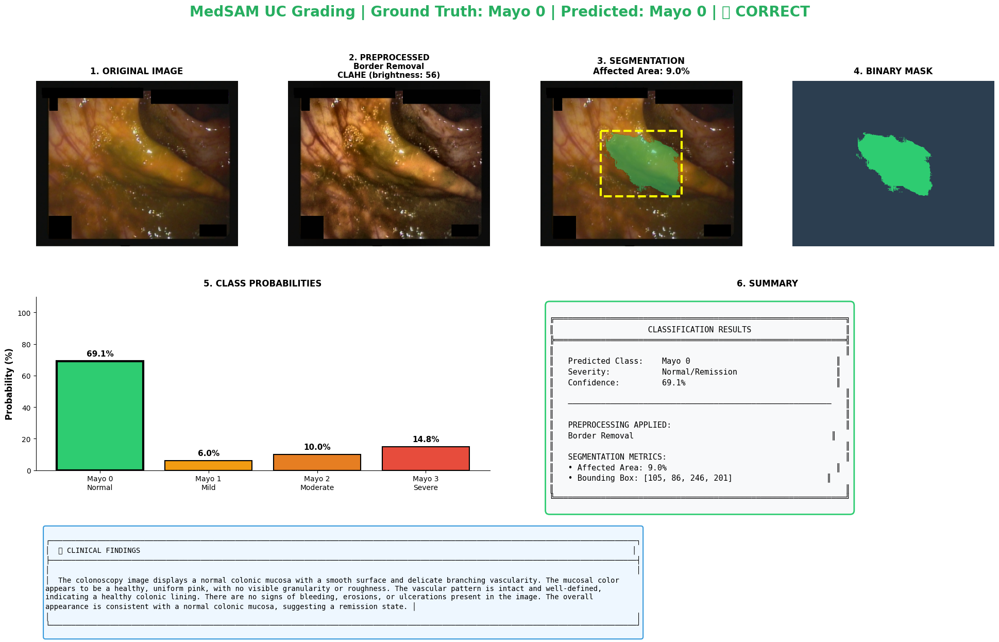


[02/20] Creating dashboard for Patient 271...
   💾 Saved: dashboard_01_P271_GT0_Pred0.png


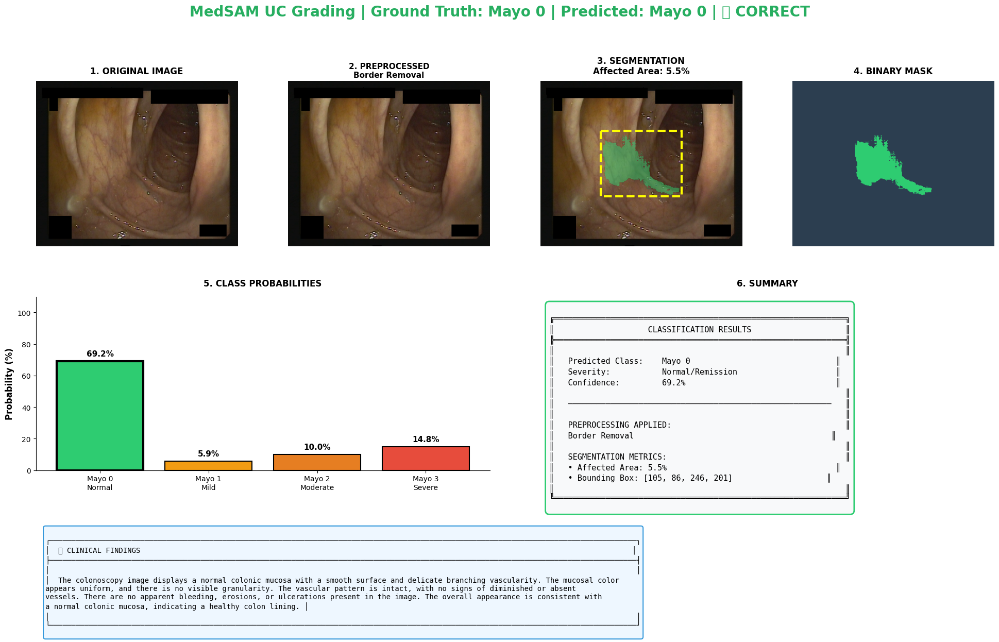


[03/20] Creating dashboard for Patient 534...
   💾 Saved: dashboard_02_P534_GT0_Pred0.png


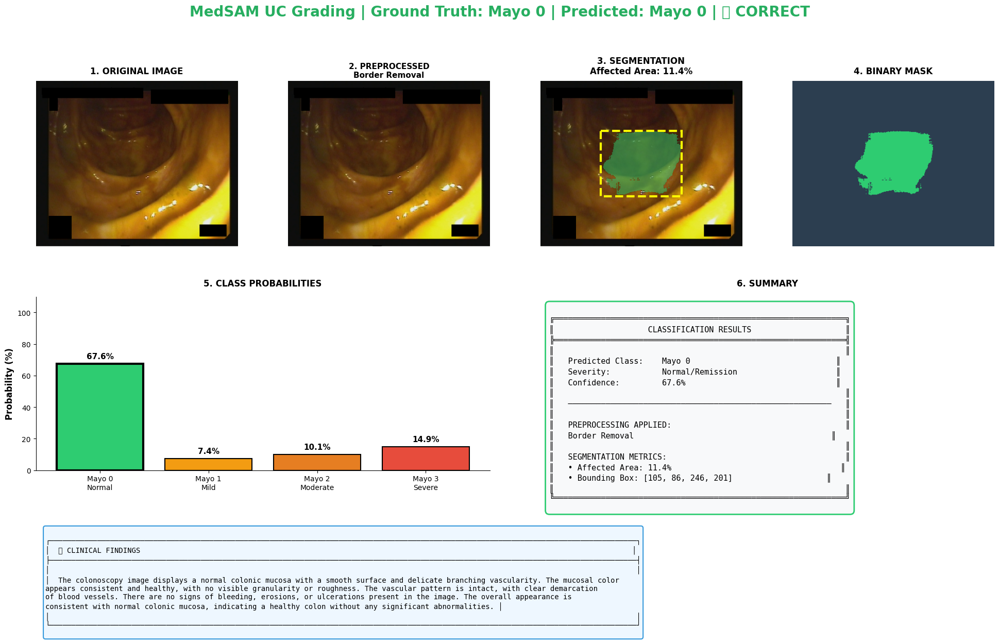


[04/20] Creating dashboard for Patient 497...
   💾 Saved: dashboard_03_P497_GT0_Pred0.png


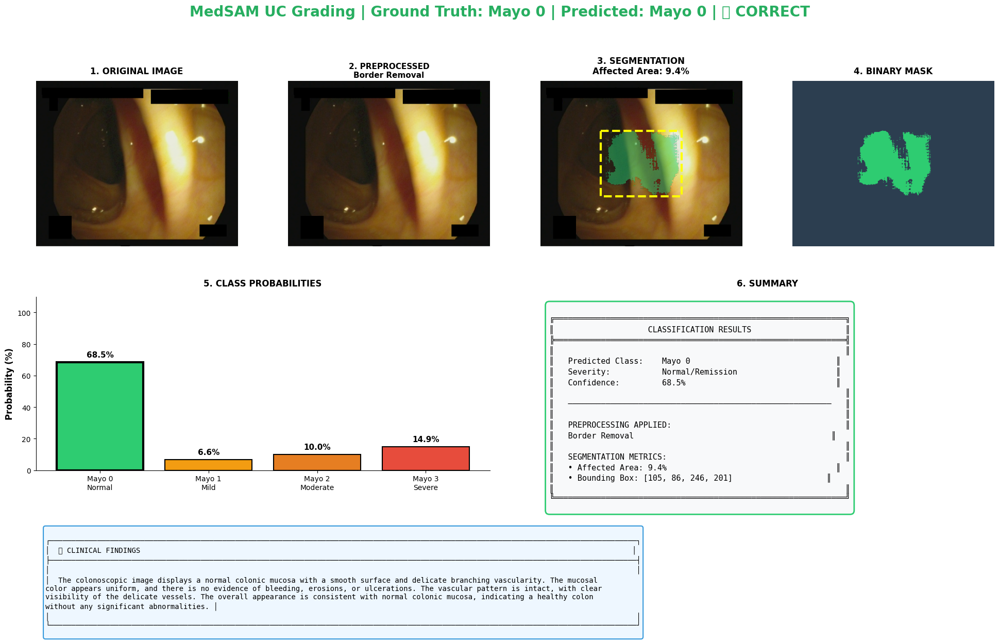


[05/20] Creating dashboard for Patient 236...
   💾 Saved: dashboard_04_P236_GT0_Pred0.png


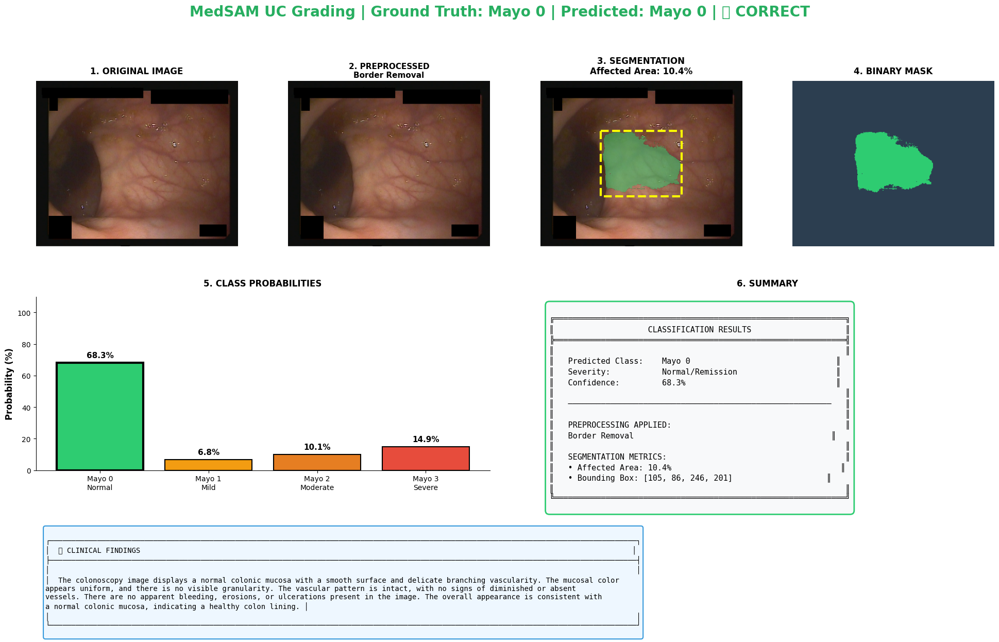


[06/20] Creating dashboard for Patient 376...
   💾 Saved: dashboard_05_P376_GT1_Pred0.png


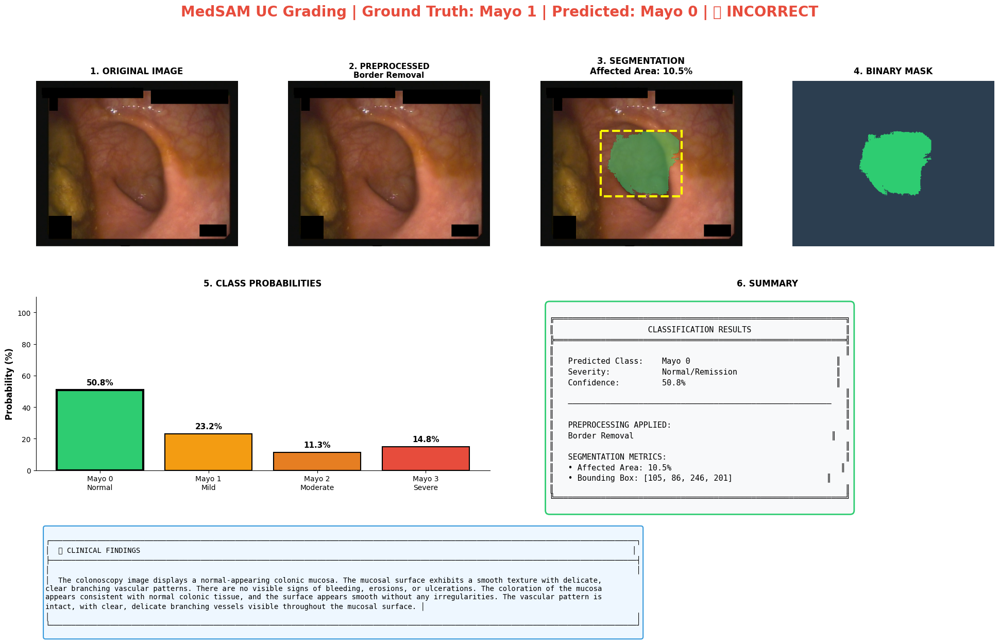


[07/20] Creating dashboard for Patient 435...
   💾 Saved: dashboard_06_P435_GT1_Pred1.png


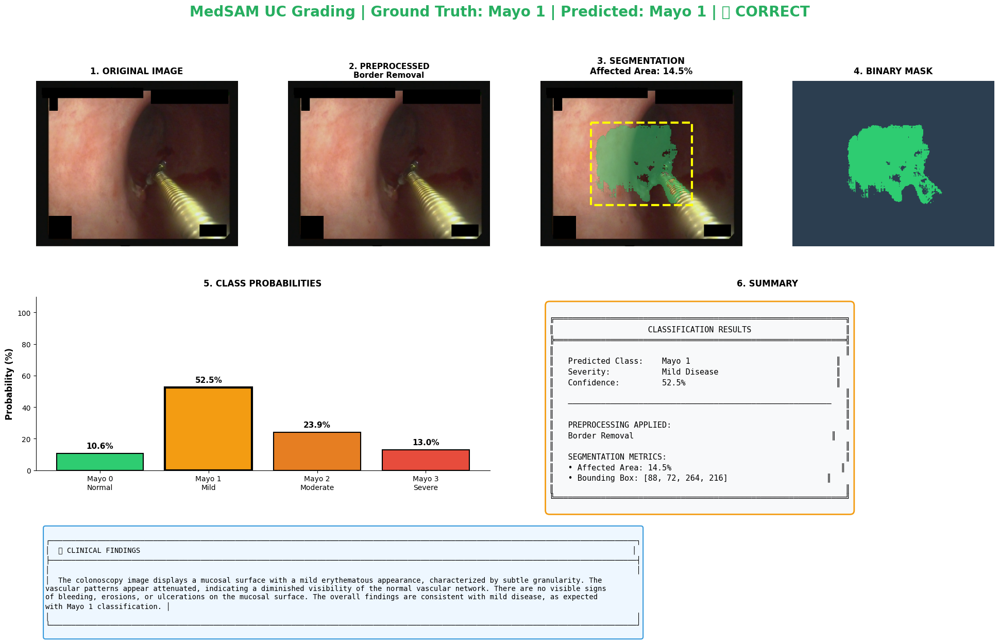


[08/20] Creating dashboard for Patient 393...
   💾 Saved: dashboard_07_P393_GT1_Pred1.png


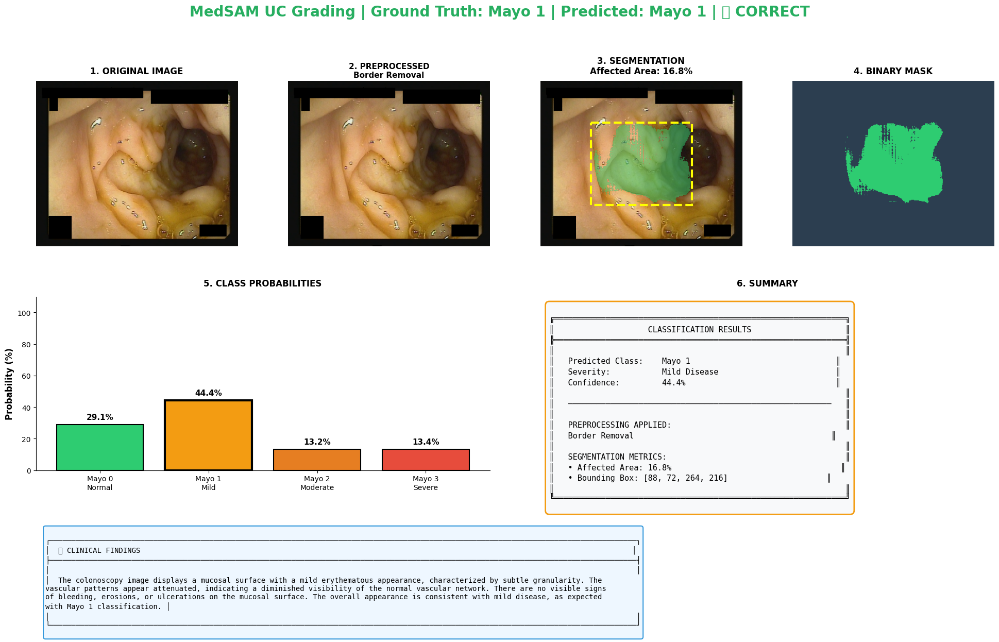


[09/20] Creating dashboard for Patient 201...
   💾 Saved: dashboard_08_P201_GT1_Pred1.png


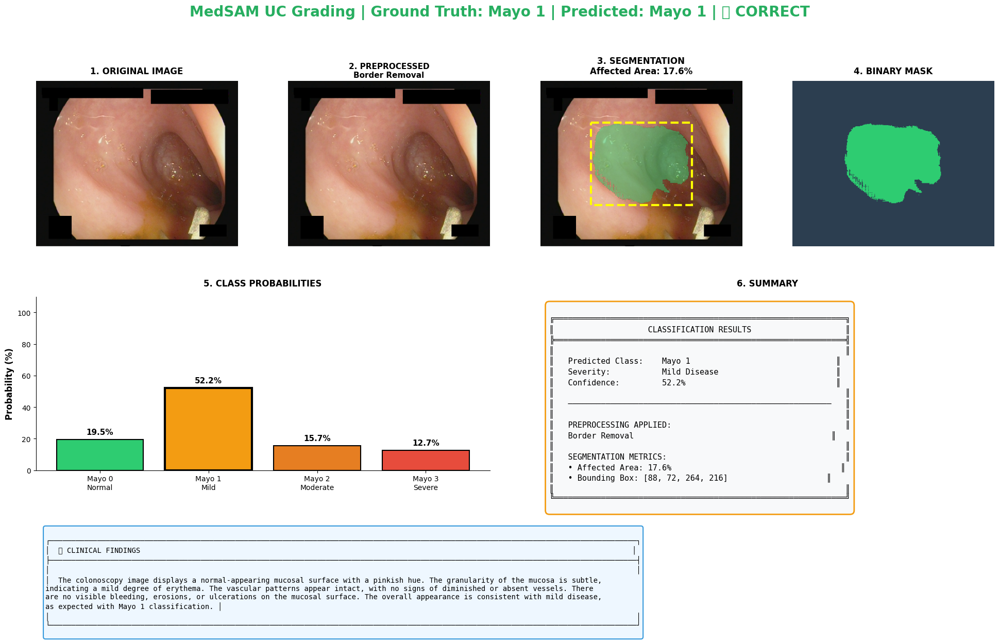


[10/20] Creating dashboard for Patient 356...
   💾 Saved: dashboard_09_P356_GT1_Pred1.png


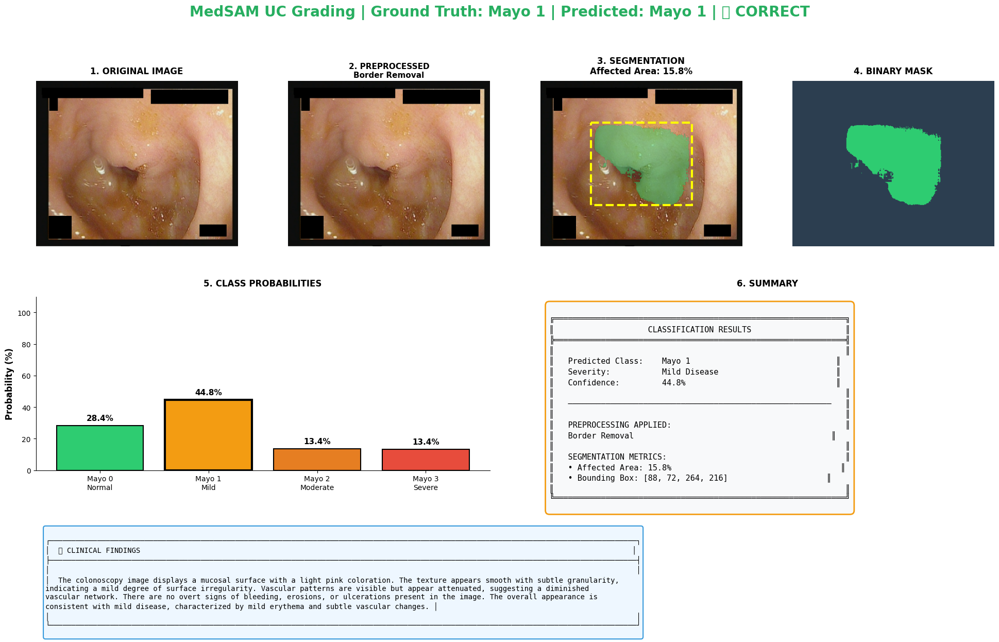


[11/20] Creating dashboard for Patient 531...
   💾 Saved: dashboard_10_P531_GT2_Pred1.png


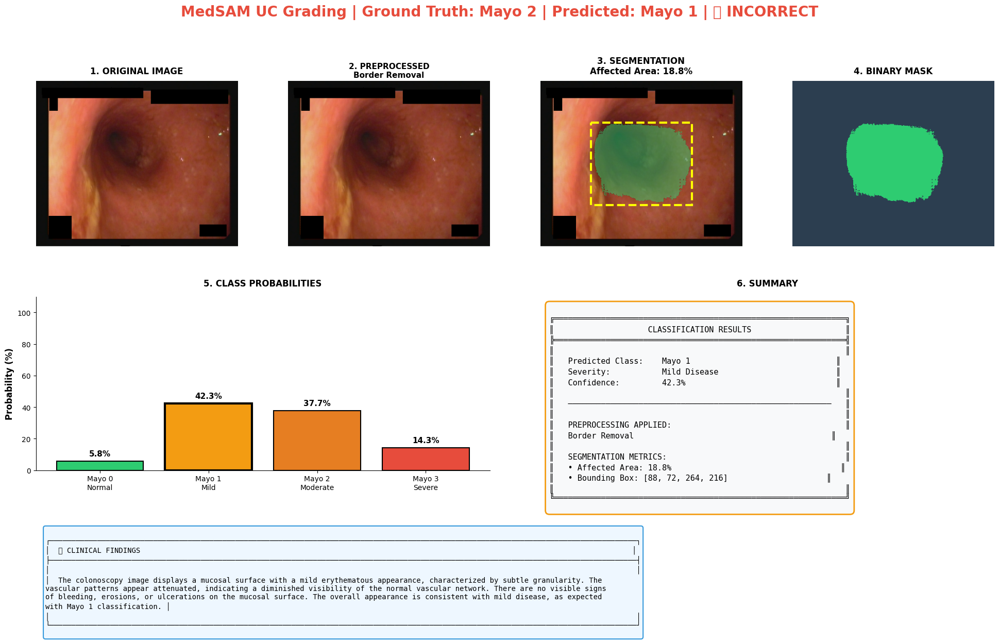


[12/20] Creating dashboard for Patient 469...
   💾 Saved: dashboard_11_P469_GT2_Pred3.png


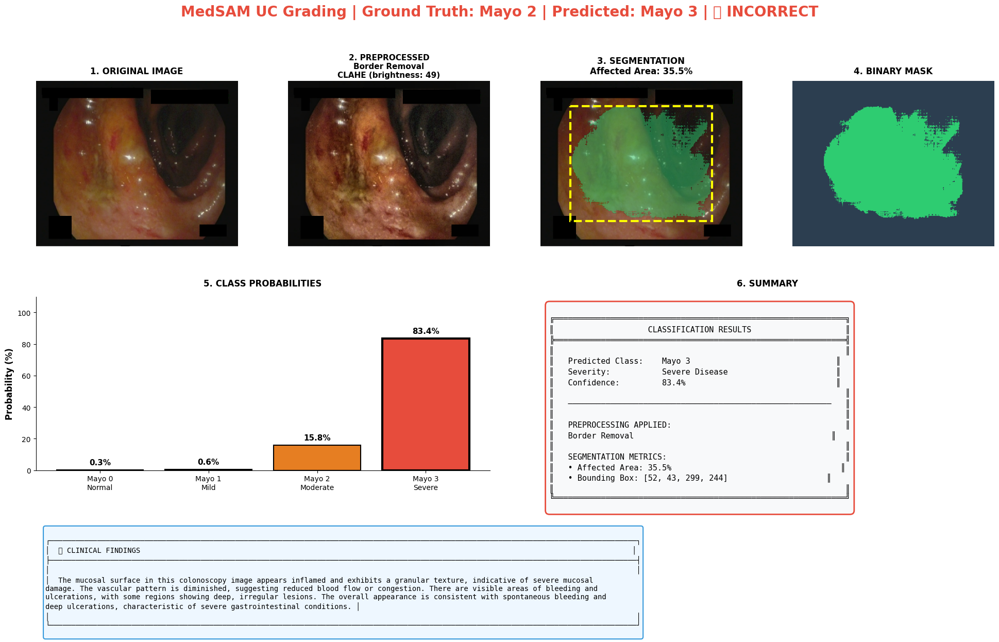


[13/20] Creating dashboard for Patient 475...
   💾 Saved: dashboard_12_P475_GT2_Pred1.png


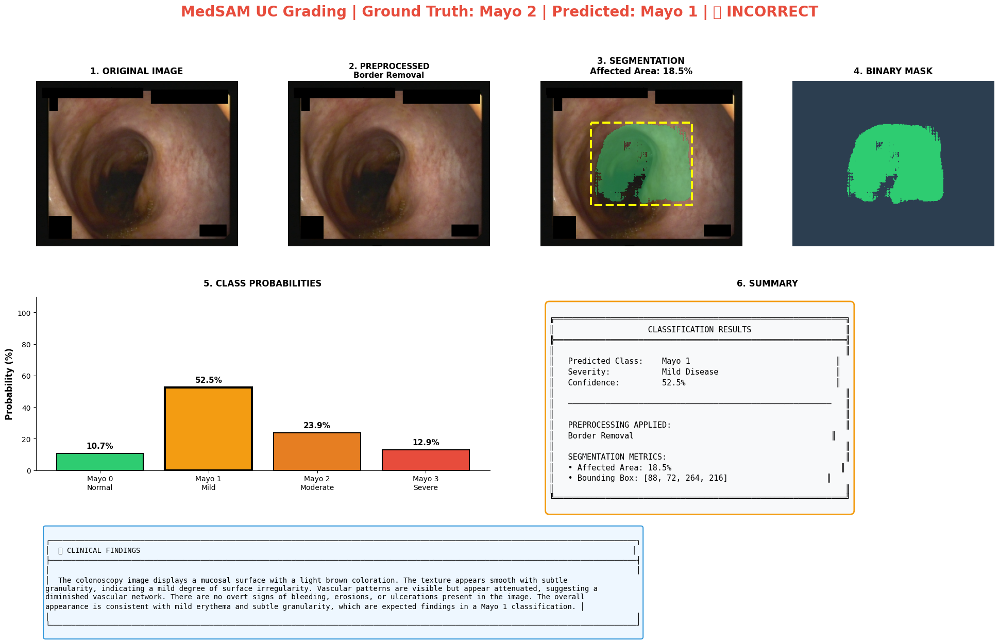


[14/20] Creating dashboard for Patient 168...
   💾 Saved: dashboard_13_P168_GT2_Pred2.png


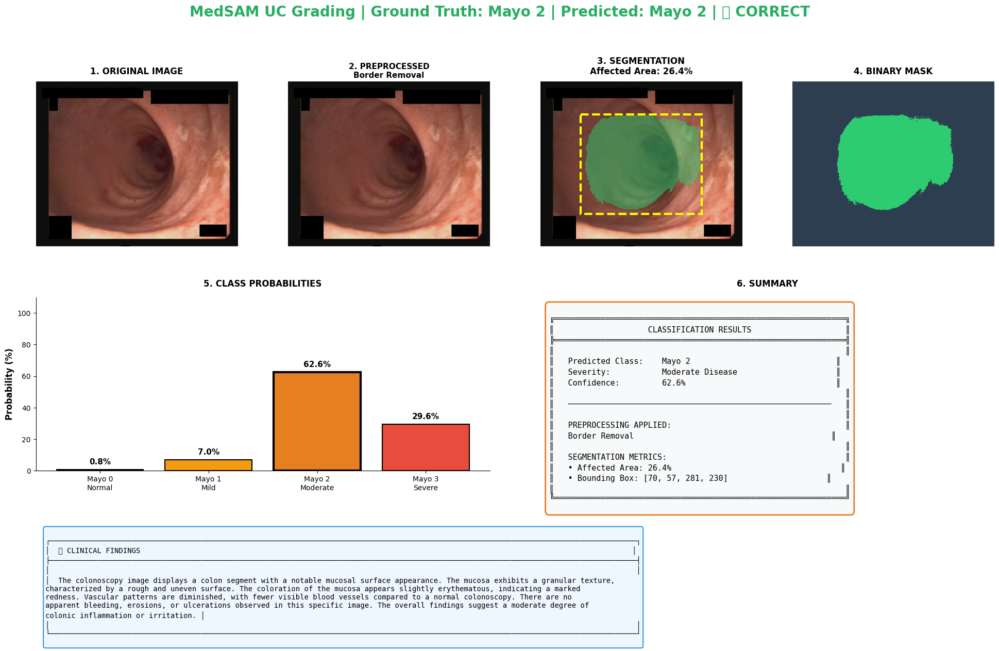


[15/20] Creating dashboard for Patient 39...
   💾 Saved: dashboard_14_P39_GT2_Pred3.png


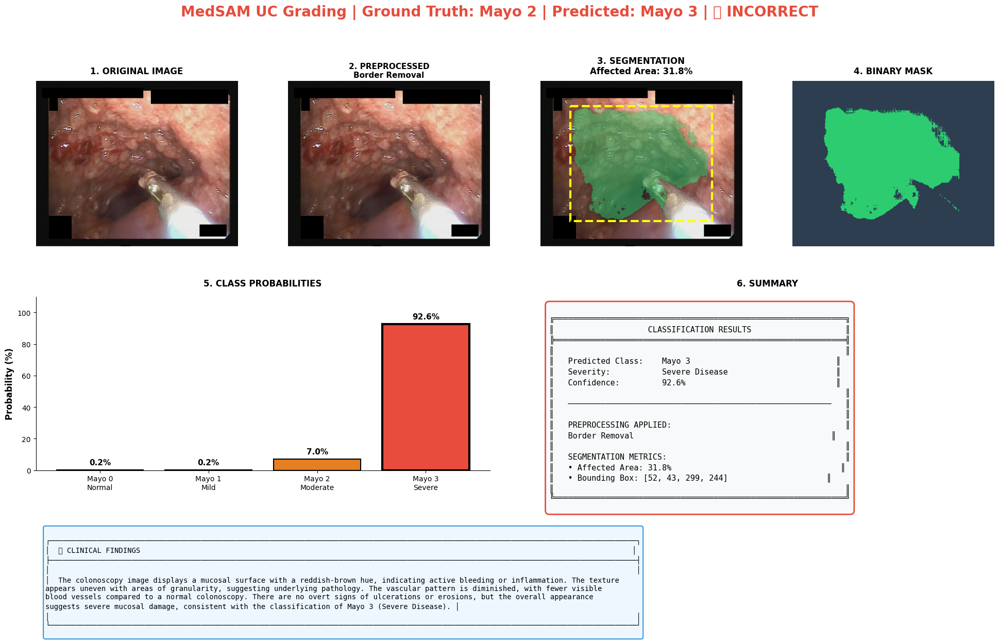


[16/20] Creating dashboard for Patient 222...
   💾 Saved: dashboard_15_P222_GT3_Pred3.png


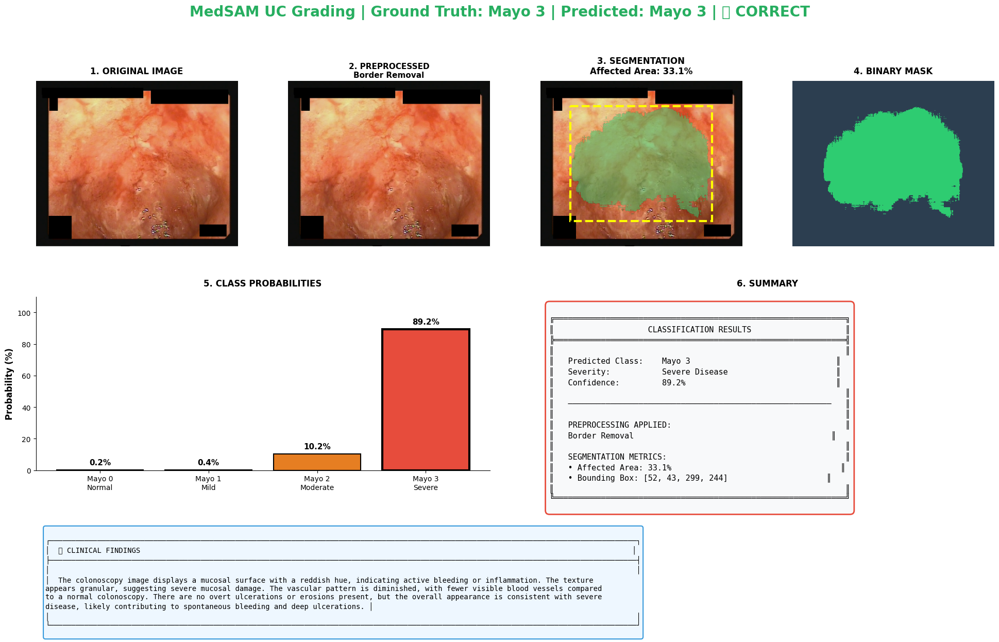


[17/20] Creating dashboard for Patient 67...
   💾 Saved: dashboard_16_P67_GT3_Pred3.png


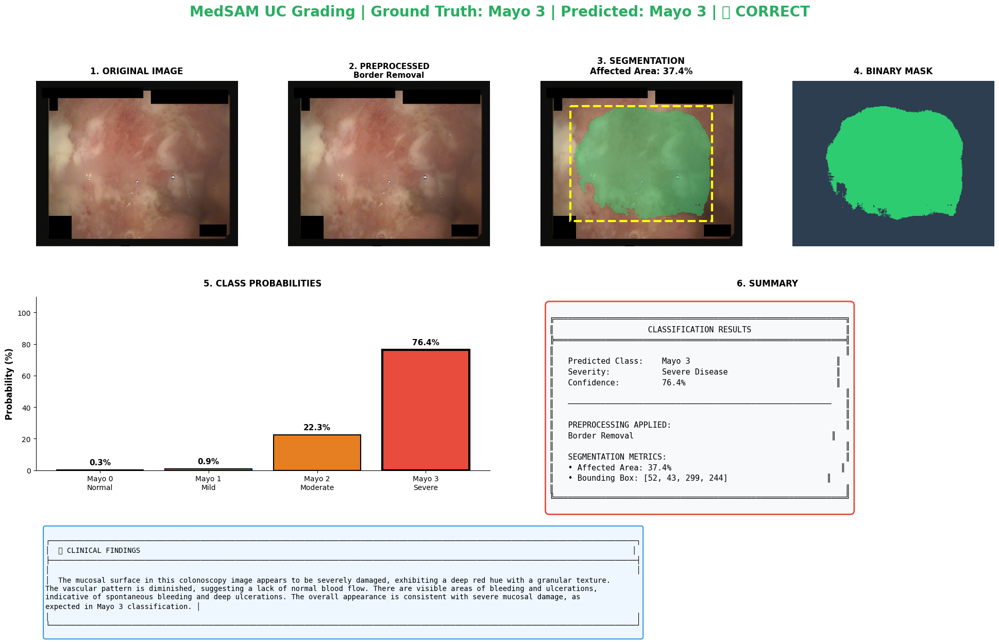


[18/20] Creating dashboard for Patient 565...
   💾 Saved: dashboard_17_P565_GT3_Pred3.png


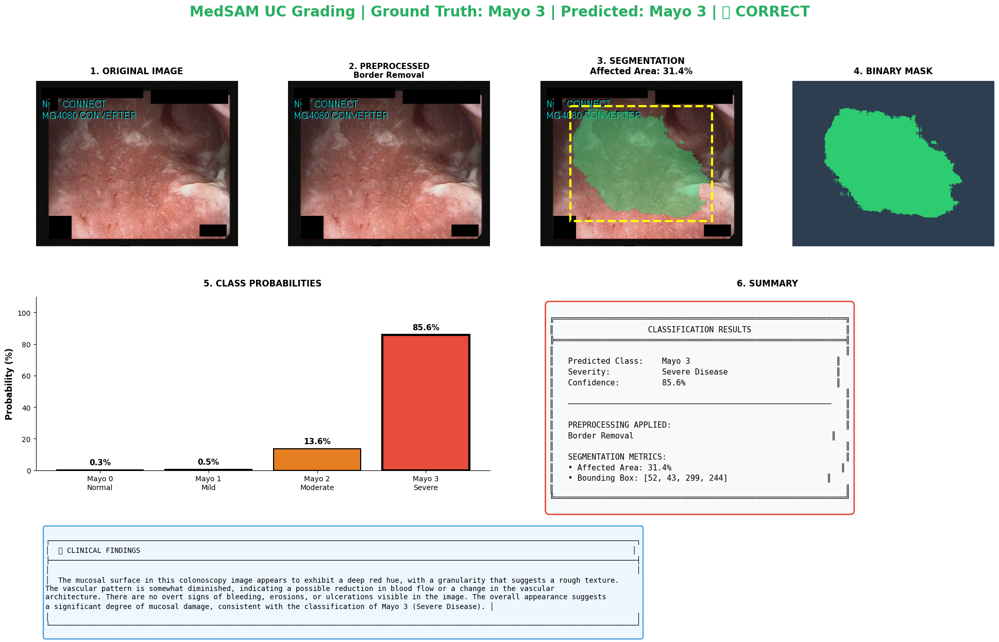


[19/20] Creating dashboard for Patient 24...
   💾 Saved: dashboard_18_P24_GT3_Pred3.png


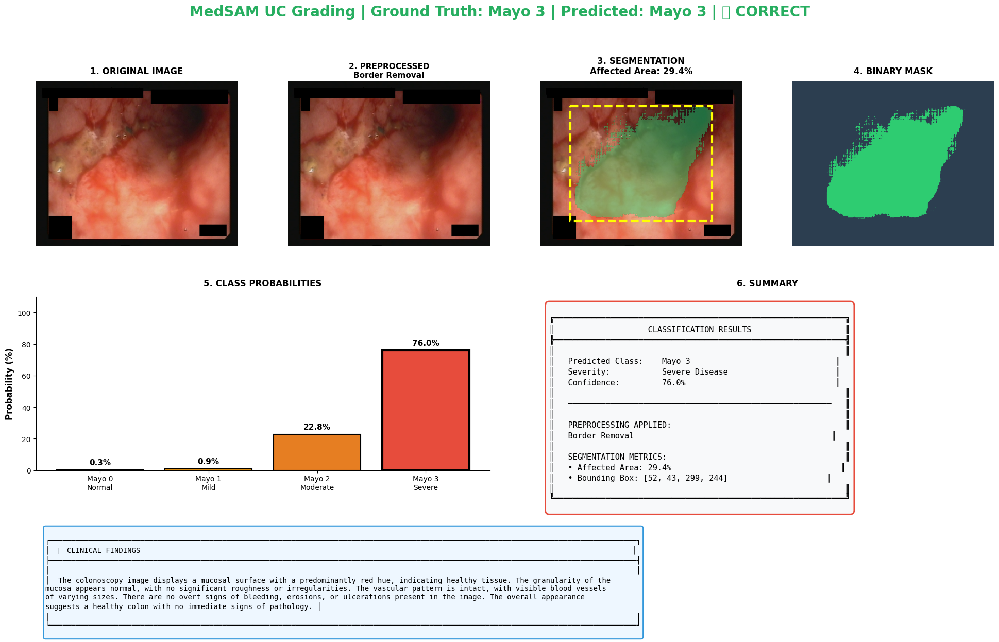


[20/20] Creating dashboard for Patient 196...
   💾 Saved: dashboard_19_P196_GT3_Pred3.png


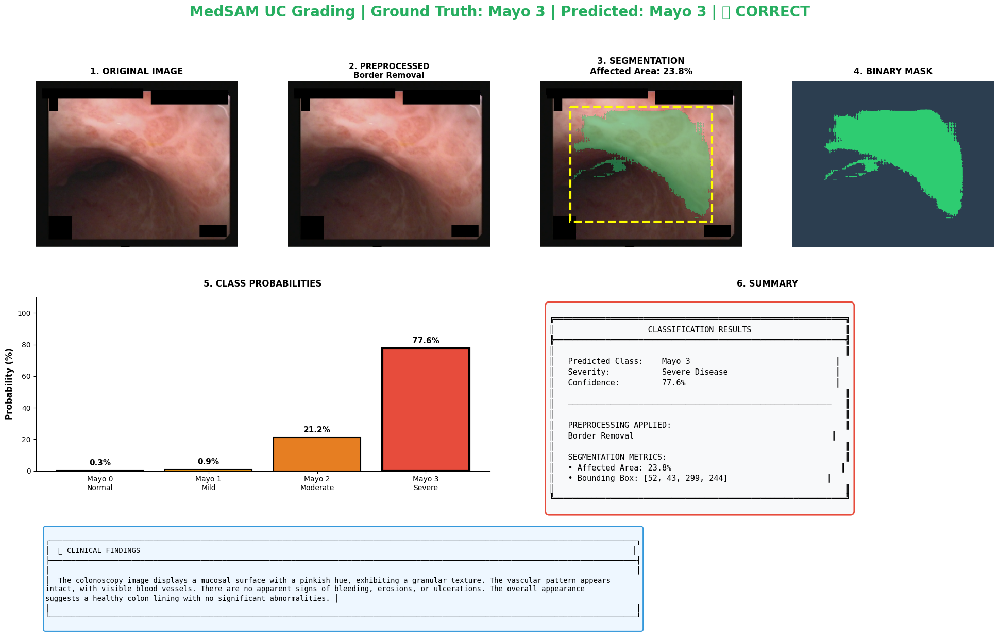


✅ All dashboards saved to: /kaggle/working/outputs/dashboards/


In [38]:
# ===== CELL 12: GENERATE DASHBOARDS FOR ALL RESULTS =====

print("="*70)
print("📊 GENERATING VISUALIZATION DASHBOARDS")
print("="*70)

for result in all_results:
    if result['success']:
        idx = result['index']
        patient = result['patient']
        gt = result['ground_truth']
        pred = result['classification']['predicted_class']
        
        save_path = f"{Config.OUTPUT_DIR}/dashboards/dashboard_{idx:02d}_P{patient}_GT{gt}_Pred{pred}.png"
        
        print(f"\n[{idx+1:02d}/{len(all_results)}] Creating dashboard for Patient {patient}...")
        create_professional_dashboard(result, save_path)

print("\n" + "="*70)
print(f"✅ All dashboards saved to: {Config.OUTPUT_DIR}/dashboards/")
print("="*70)

📈 EVALUATION METRICS

📊 OVERALL METRICS:
   • Accuracy: 75.00%
   • Balanced Accuracy: 75.00%
   • Quadratic Weighted Kappa (QWK): 0.9107
   • Average Confidence: 66.3%

📋 CLASSIFICATION REPORT:
              precision    recall  f1-score   support

      Mayo 0      0.833     1.000     0.909         5
      Mayo 1      0.667     0.800     0.727         5
      Mayo 2      1.000     0.200     0.333         5
      Mayo 3      0.714     1.000     0.833         5

    accuracy                          0.750        20
   macro avg      0.804     0.750     0.701        20
weighted avg      0.804     0.750     0.701        20


📊 CONFUSION MATRIX:


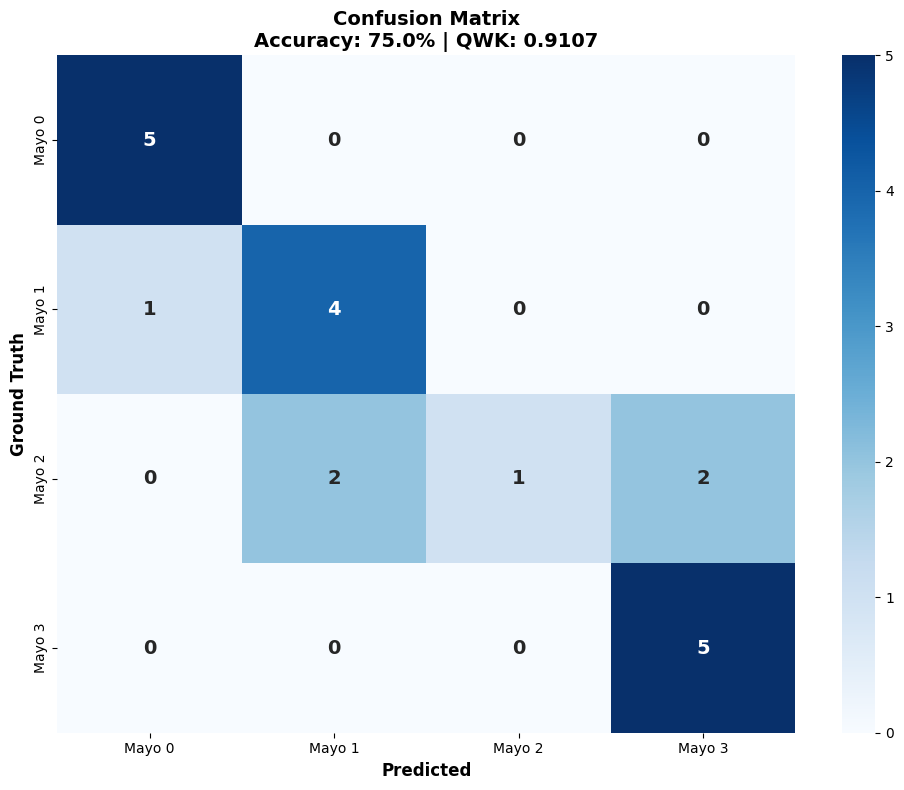


📊 PER-CLASS METRICS:
------------------------------------------------------------
   Mayo 0: Accuracy 100.0% | Avg Confidence: 68.5%
   Mayo 1: Accuracy 80.0% | Avg Confidence: 48.9%
   Mayo 2: Accuracy 20.0% | Avg Confidence: 66.7%
   Mayo 3: Accuracy 100.0% | Avg Confidence: 81.0%


In [39]:
# ===== CELL 13: EVALUATION METRICS =====

print("="*70)
print("📈 EVALUATION METRICS")
print("="*70)

# Extract predictions and ground truth
successful_results = [r for r in all_results if r['success']]

y_true = [r['ground_truth'] for r in successful_results]
y_pred = [r['classification']['predicted_class'] for r in successful_results]
confidences = [r['classification']['confidence'] for r in successful_results]

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
balanced_acc = balanced_accuracy_score(y_true, y_pred)
qwk = cohen_kappa_score(y_true, y_pred, weights='quadratic')

print(f"\n📊 OVERALL METRICS:")
print(f"   • Accuracy: {accuracy*100:.2f}%")
print(f"   • Balanced Accuracy: {balanced_acc*100:.2f}%")
print(f"   • Quadratic Weighted Kappa (QWK): {qwk:.4f}")
print(f"   • Average Confidence: {np.mean(confidences)*100:.1f}%")

# Classification report
print(f"\n📋 CLASSIFICATION REPORT:")
print(classification_report(y_true, y_pred, 
                           target_names=['Mayo 0', 'Mayo 1', 'Mayo 2', 'Mayo 3'],
                           digits=3))

# Confusion Matrix
print(f"\n📊 CONFUSION MATRIX:")
cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Mayo 0', 'Mayo 1', 'Mayo 2', 'Mayo 3'],
            yticklabels=['Mayo 0', 'Mayo 1', 'Mayo 2', 'Mayo 3'],
            annot_kws={'size': 14, 'weight': 'bold'},
            ax=ax)
ax.set_xlabel('Predicted', fontsize=12, fontweight='bold')
ax.set_ylabel('Ground Truth', fontsize=12, fontweight='bold')
ax.set_title(f'Confusion Matrix\nAccuracy: {accuracy*100:.1f}% | QWK: {qwk:.4f}', 
             fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(f"{Config.OUTPUT_DIR}/confusion_matrix.png", dpi=150, bbox_inches='tight')
plt.show()

# Per-class accuracy
print(f"\n📊 PER-CLASS METRICS:")
print("-" * 60)
for cls in [0, 1, 2, 3]:
    cls_mask = np.array(y_true) == cls
    if cls_mask.sum() > 0:
        cls_acc = (np.array(y_pred)[cls_mask] == cls).mean()
        cls_conf = np.array(confidences)[cls_mask].mean()
        print(f"   Mayo {cls}: Accuracy {cls_acc*100:.1f}% | Avg Confidence: {cls_conf*100:.1f}%")

🔧 PREPROCESSING STATISTICS

📊 Preprocessing Applied:
   • Total Images Processed: 80
   • Dark Images (CLAHE): 8
   • Bright Images (Normalized): 0
   • Low Contrast (Enhanced): 0
   • Too Smooth (Sharpened): 0
   • Borders Removed: 80
   • No Processing Needed: 0


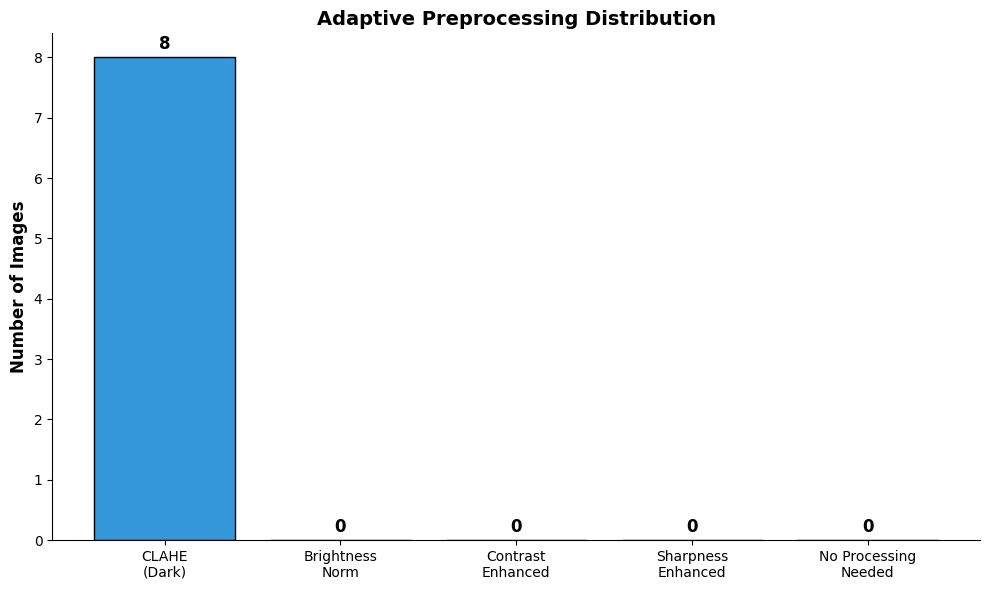

In [40]:
# ===== CELL 14: PREPROCESSING STATISTICS =====

print("="*70)
print("🔧 PREPROCESSING STATISTICS")
print("="*70)

stats = preprocessor.get_statistics()

print(f"\n📊 Preprocessing Applied:")
print(f"   • Total Images Processed: {stats['total_processed']}")
print(f"   • Dark Images (CLAHE): {stats['dark_enhanced']}")
print(f"   • Bright Images (Normalized): {stats['bright_normalized']}")
print(f"   • Low Contrast (Enhanced): {stats['contrast_enhanced']}")
print(f"   • Too Smooth (Sharpened): {stats['sharpness_enhanced']}")
print(f"   • Borders Removed: {stats['borders_removed']}")
print(f"   • No Processing Needed: {stats['no_processing_needed']}")

# Visualization
fig, ax = plt.subplots(figsize=(10, 6))

preproc_data = {
    'CLAHE\n(Dark)': stats['dark_enhanced'],
    'Brightness\nNorm': stats['bright_normalized'],
    'Contrast\nEnhanced': stats['contrast_enhanced'],
    'Sharpness\nEnhanced': stats['sharpness_enhanced'],
    'No Processing\nNeeded': stats['no_processing_needed']
}

colors = ['#3498db', '#f39c12', '#9b59b6', '#1abc9c', '#95a5a6']
bars = ax.bar(preproc_data.keys(), preproc_data.values(), color=colors, edgecolor='black')

for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{int(height)}',
                xy=(bar.get_x() + bar.get_width()/2, height),
                xytext=(0, 3), textcoords="offset points",
                ha='center', va='bottom', fontsize=12, fontweight='bold')

ax.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
ax.set_title('Adaptive Preprocessing Distribution', fontsize=14, fontweight='bold')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(f"{Config.OUTPUT_DIR}/preprocessing_stats.png", dpi=150, bbox_inches='tight')
plt.show()

In [41]:
# ===== CELL 15: EXPORT RESULTS =====

print("="*70)
print("💾 EXPORTING RESULTS")
print("="*70)

# Create results dataframe
results_data = []

for r in successful_results:
    results_data.append({
        'index': r['index'],
        'patient': r['patient'],
        'image_path': r['image_path'],
        'ground_truth': r['ground_truth'],
        'predicted_class': r['classification']['predicted_class'],
        'predicted_label': r['classification']['predicted_label'],
        'confidence': r['classification']['confidence'],
        'severity': r['classification']['severity'],
        'is_correct': r['is_correct'],
        'affected_area_pct': r['segmentation']['affected_area_pct'],
        'bounding_box': str(r['segmentation']['bounding_box']),
        'preprocessing': r['classification']['preprocess_info']['processing_steps'][0],
        'clinical_caption': r['clinical_caption'],
        'probabilities': str(r['classification']['probabilities'].tolist())
    })

results_df = pd.DataFrame(results_data)

# Save to CSV
csv_path = f"{Config.OUTPUT_DIR}/inference_results.csv"
results_df.to_csv(csv_path, index=False)
print(f"✅ Results saved to: {csv_path}")

# Save summary report
summary = {
    'timestamp': datetime.now().isoformat(),
    'total_images': len(results_df),
    'accuracy': accuracy,
    'balanced_accuracy': balanced_acc,
    'qwk': qwk,
    'avg_confidence': np.mean(confidences),
    'preprocessing_stats': stats,
    'per_class_accuracy': {
        f'Mayo_{cls}': float((np.array(y_pred)[np.array(y_true) == cls] == cls).mean())
        for cls in [0, 1, 2, 3]
    }
}

json_path = f"{Config.OUTPUT_DIR}/summary_report.json"
with open(json_path, 'w') as f:
    json.dump(summary, f, indent=2)
print(f"✅ Summary report saved to: {json_path}")

# List all outputs
print(f"\n📁 Output Directory Contents:")
for item in sorted(os.listdir(Config.OUTPUT_DIR)):
    item_path = os.path.join(Config.OUTPUT_DIR, item)
    if os.path.isdir(item_path):
        count = len(os.listdir(item_path))
        print(f"   📂 {item}/ ({count} files)")
    else:
        size = os.path.getsize(item_path) / 1024
        print(f"   📄 {item} ({size:.1f} KB)")

💾 EXPORTING RESULTS
✅ Results saved to: /kaggle/working/outputs/inference_results.csv
✅ Summary report saved to: /kaggle/working/outputs/summary_report.json

📁 Output Directory Contents:
   📄 confusion_matrix.png (51.6 KB)
   📂 dashboards/ (20 files)
   📄 inference_results.csv (14.8 KB)
   📂 masks/ (0 files)
   📄 preprocessing_stats.png (43.5 KB)
   📄 summary_report.json (0.5 KB)


In [42]:
# ===== CELL 16: FINAL SUMMARY =====

print("="*70)
print("🏁 MEDSAM UC GRADING SYSTEM - FINAL SUMMARY")
print("="*70)

print(f"""
╔══════════════════════════════════════════════════════════════════════════╗
║                        INFERENCE RESULTS SUMMARY                   ║
╠══════════════════════════════════════════════════════════════════════════╣
║                                                                    ║
║  📊 CLASSIFICATION PERFORMANCE                                     ║
║  ─────────────────────────────────────────────────────────────────────   ║
║  • Total Images Tested:     {len(successful_results):<40}          ║
║  • Accuracy:                {accuracy*100:.2f}%{' '*35}            ║
║  • Balanced Accuracy:       {balanced_acc*100:.2f}%{' '*35}        ║
║  • Quadratic Weighted Kappa: {qwk:.4f}{' '*34}                     ║
║  • Average Confidence:      {np.mean(confidences)*100:.1f}%{' '*36}║
║                                                                    ║
║  🔧 PREPROCESSING APPLIED                                          ║
║  ─────────────────────────────────────────────────────────────────────   ║
║  • CLAHE (Dark Images):     {stats['dark_enhanced']:<40}           ║
║  • Brightness Normalized:   {stats['bright_normalized']:<40}       ║
║  • Sharpness Enhanced:      {stats['sharpness_enhanced']:<40}      ║
║  • No Processing Needed:    {stats['no_processing_needed']:<40}    ║
║                                                                    ║
║  📁 OUTPUT FILES                                                   ║
║  ─────────────────────────────────────────────────────────────────────   ║
║  • Dashboards:              {Config.OUTPUT_DIR}/dashboards/{' '*14}║
║  • Results CSV:             inference_results.csv{' '*24}          ║
║  • Summary JSON:            summary_report.json{' '*26}            ║
║  • Confusion Matrix:        confusion_matrix.png{' '*25}           ║
║                                                                    ║
╚══════════════════════════════════════════════════════════════════════════╝

🏥 PIPELINE COMPONENTS:
   1. Adaptive Preprocessing (CLAHE, Sharpness, Brightness)
   2. MedSAM Classifier (ViT-Base, 93.7M params)
   3. MedSAM Segmentation (Mask + Bounding Box)
   4. Qwen2-VL-7B Clinical Captioning

✅ Pipeline execution complete!
""")

🏁 MEDSAM UC GRADING SYSTEM - FINAL SUMMARY

╔══════════════════════════════════════════════════════════════════════════╗
║                        INFERENCE RESULTS SUMMARY                   ║
╠══════════════════════════════════════════════════════════════════════════╣
║                                                                    ║
║  📊 CLASSIFICATION PERFORMANCE                                     ║
║  ─────────────────────────────────────────────────────────────────────   ║
║  • Total Images Tested:     20                                                ║
║  • Accuracy:                75.00%                                               ║
║  • Balanced Accuracy:       75.00%                                           ║
║  • Quadratic Weighted Kappa: 0.9107                                                       ║
║  • Average Confidence:      66.3%                                    ║
║                                                                    ║
║  🔧 PREPROCESSING APPLIED 